In [1]:
# Guiana_temperature_analysis.ipynb
# Create simple code to reproduce the figures from the paper Hes et al. 2025
# "East Amazon forest understory temperatures reached a record high in 2023-2024"


## 1) Import modules 

In [1]:
import pandas as pd
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib as mpl
from datetime import datetime as dt
from datetime import datetime, date, timedelta
import matplotlib.colors as colors
from mycolorpy import colorlist as mcp
import math
import matplotlib.dates as mdates
import seaborn as sns
import sys
from matplotlib import cm
from sklearn.linear_model import LinearRegression
from scipy.stats import gaussian_kde
from scipy.stats import theilslopes
import dataframe_image as dfi



Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


In [2]:
# definition of functions used in the script


def convert360_180(_ds):
    """
    convert longitude from 0-360 to -180 -- 180 deg
    """
    # check if already 
    attrs = _ds['longitude'].attrs
    if _ds['longitude'].min() >= 0:
        with xr.set_options(keep_attrs=True): 
            _ds.coords['longitude'] = (_ds['longitude'] + 180) % 360 - 180
        _ds = _ds.sortby('longitude')
    return _ds

def Theilsen(d):
    x=np.arange(len(d.index))
    y=np.array(d.iloc[:,1])
    ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return values
    return(ts_slope*12, ts_inter, ts_ls*12, ts_hs*12)  # to get yearly slopes multiply the monthly data by 12

## 2) Load datasets

In [5]:
# Paths
inputpath="/Users/gabrielhes/Desktop/PhD/Work/Axis2/FG_microclimatology_paper/Final_analysis/input_data/" 
outputpath="/Users/gabrielhes/Desktop/PhD/Work/Axis2/FG_microclimatology_paper/Final_analysis/output_data/"
figpath='/Users/gabrielhes/Desktop/PhD/Work/Axis2/FG_microclimatology_paper/Final_analysis/figures/'

In [7]:
# open ERA5-Land macroclimate data
era = xr.open_dataset(inputpath+'ERA5L_hourly_T2m_2014-2024.nc')-273.15
# shift time to local time zone
era['valid_time']=era.valid_time.to_dataframe()['valid_time'].dt.tz_localize('utc').dt.tz_convert('America/Cayenne').dt.tz_localize(None).values

# Define array of coordinates for forest sites and weather stations
Site_loc=pd.DataFrame({'Site_Name': ['NOU','PAR','LAU','ITO','Kourou','StLau','Saul','CayMat'], 
                       'lat': [4.071667, 5.260416, 5.478813, 3.023333, 5.209167, 5.485500,3.624000,4.822333],
                       'lon': [-52.7325, -52.929874, -53.576096, -53.083611, -52.748000, -54.031667, -53.208167	,-52.365333]})
era_nou,era_par,era_lau,era_ito, era_Kourou, era_StLau, era_Saul, era_CayMat =[era.sel(longitude=Site_loc[Site_loc['Site_Name']==s]['lon'].values, latitude=Site_loc[Site_loc['Site_Name']==s]['lat'].values, method="nearest") for s in Site_loc.Site_Name]


In [8]:
# open microclimate data
#dpath="/Users/gabrielhes/Desktop/PhD/Work/Axis2/Data_Guyane/Final_dataset_11-03-25/" #03-12-24/" #25-10-24/"  # 06-10-24

# open data
df = pd.read_csv(inputpath+'total_T_understory.csv', dtype={
    'Raw_data_identifier': 'string',
    'Tair': 'float64',
    'ForestName':'string',
    'ForestClass':'string',	
    'Elevation':'float64',	
    'LongTermPM':'bool',
    'Site_id': 'string'}, infer_datetime_format=True, parse_dates=['date'])  #inputpath+'total_T_understory.csv'
ForestNames=df['ForestName'].drop_duplicates()

# open microclimate metadata
m = pd.read_csv(inputpath+'total_TH_metadata.csv', sep=',')# macroclimate

# define long-term and short-term sensors
LT=df.loc[df['LongTermPM']] 
ST=df.loc[df['LongTermPM']==False]
print('Number of long and short term sensors: '+str(len(LT['Site_id'].drop_duplicates()))+', '+str(len(ST['Site_id'].drop_duplicates())))

Number of long and short term sensors: 24, 90


## 3) Methods

### 1. Gap-fill end of 2024 for long-term sensors in Paracou and Nouragues

NOU calibration period: 2024-01-01 00:00:00: 2024-07-01 21:00:00
gapfilling sensor NOUB4
gapfilling sensor NOUT3
gapfilling sensor NOUT1
NOU 2024 long-term sensors gapfilled
PAR calibration period: 2024-01-01 00:00:00: 2024-06-11 21:00:00
gapfilling sensor PARS2
gapfilling sensor PART2
gapfilling sensor PART4
PAR 2024 long-term sensors gapfilled


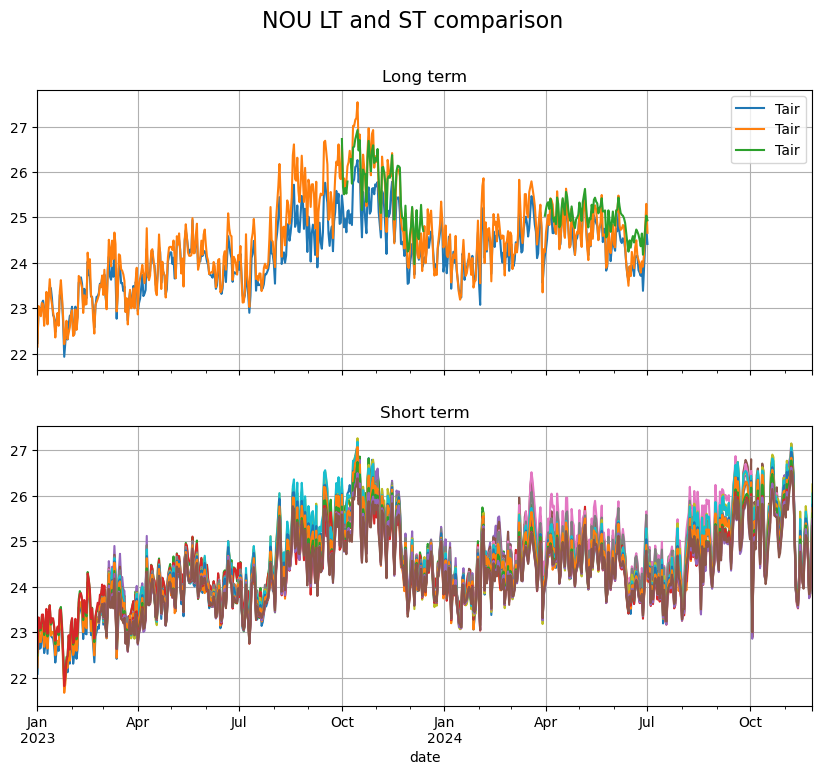

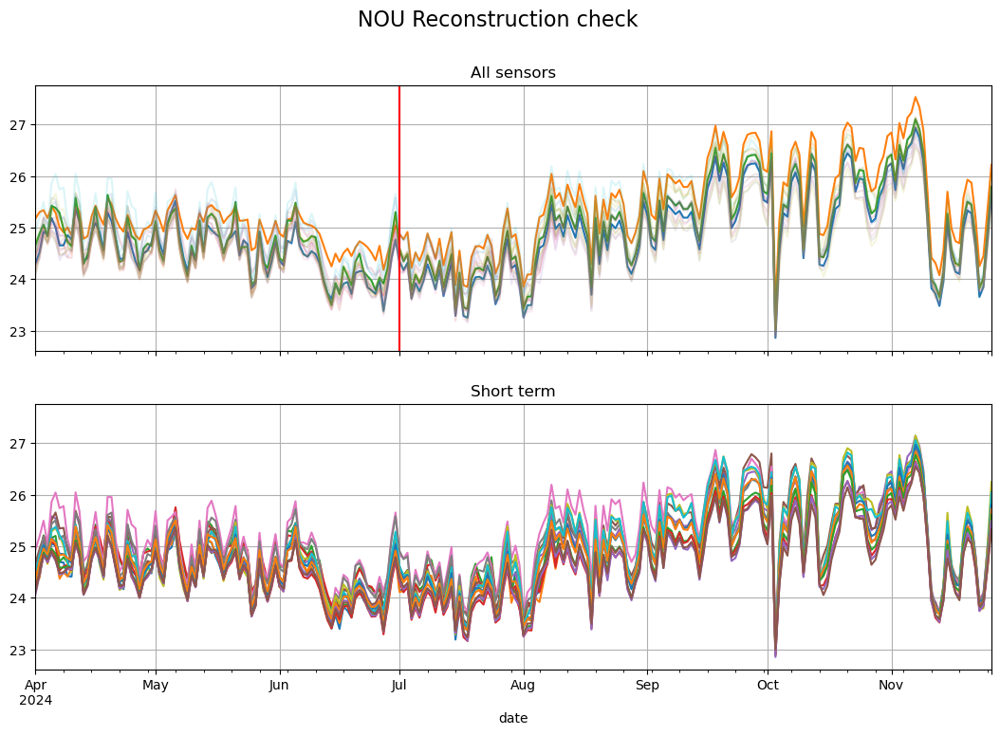

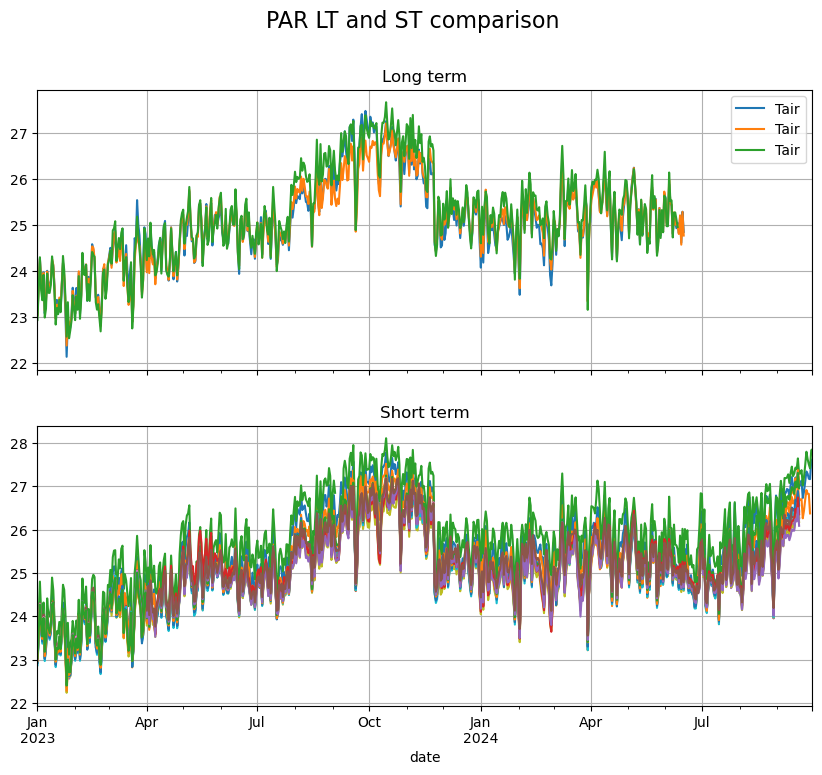

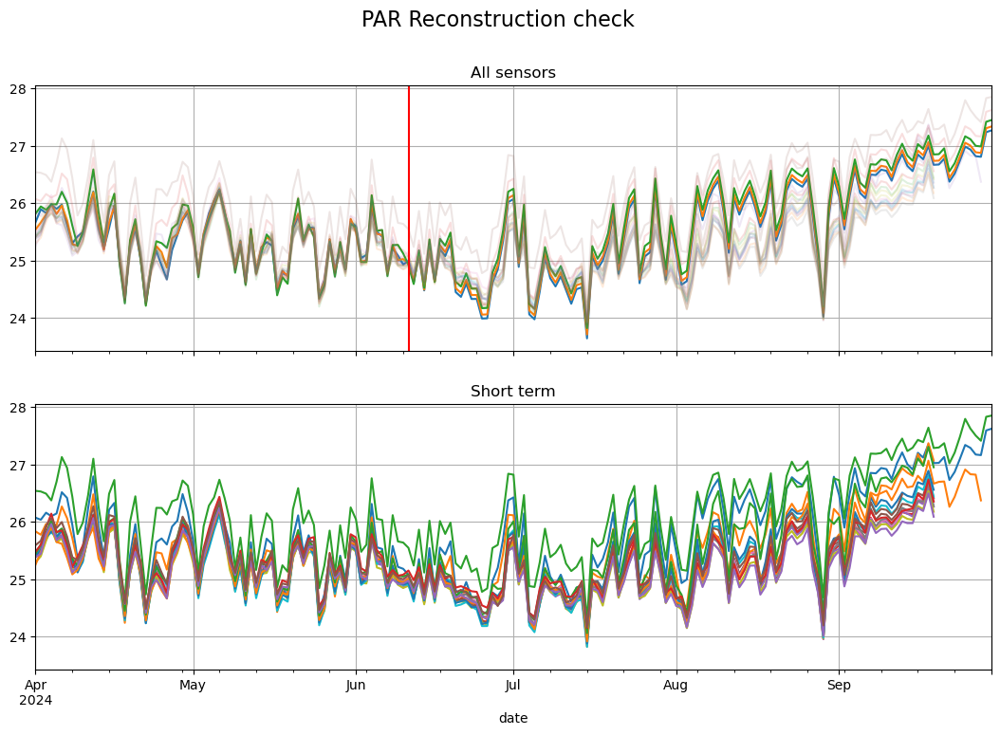

In [11]:
for f in ['NOU','PAR']:
    LTf=LT[(LT['ForestName']==f) & (LT['date']>='2023')]
    STf=ST[(ST['ForestName']==f) & (ST['date']>='2023')]

    ######## inital plot #######
    fig,ax=plt.subplots(2, sharex=True, figsize=(10,8))
    for sid in LTf['Site_id'].drop_duplicates():
        LTf[LTf['Site_id']==sid][['date','Tair']].resample("D",on="date").mean().plot(ax=ax[0])
    for sid in STf['Site_id'].drop_duplicates():
        STf[STf['Site_id']==sid][['date','Tair']].resample("D",on="date").mean().plot(ax=ax[1])
    ax[0].set_title('Long term')
    ax[1].set_title('Short term')
    [axes.grid() for axes in ax]
    ax[1].get_legend().remove()
    fig.suptitle(f+" LT and ST comparison", fontsize=16)

    # Calibration period (date start, date end)
    ds='2024-01-01 00:00:00'
    de=min([LTf[LTf['Site_id']==sid].date.max() for sid in LTf['Site_id'].drop_duplicates()]).strftime('%Y-%m-%d %X')
    print(f+' calibration period: '+str(ds)+': '+str(de))
    
    # compute median and errors over calibration period
    df_cal=df[(df['ForestName']==f) & (df['date']>=ds) & (df['date']<=de)]
    calid=df_cal['Site_id'].drop_duplicates()
    med=df_cal['Tair'].median(numeric_only=True)    
    errors=pd.DataFrame([df_cal[df_cal['Site_id']==sid]['Tair'].mean() - med for sid in calid], index=calid)

    # Reconstruction period
    ds2=(min([LTf[LTf['Site_id']==sid].date.max() for sid in LTf['Site_id'].drop_duplicates()]) + timedelta(hours=1)).strftime('%Y-%m-%d %H:%M:%S')
    de2=(max([STf[STf['Site_id']==sid].date.max() for sid in STf['Site_id'].drop_duplicates()])).strftime('%Y-%m-%d %H:%M:%S')
    df_rec=df[(df['ForestName']==f) & (df['date']>=ds2) & (df['date']<=de2)]

    # select the Sensor from which we rebuild the time series
    STf=STf.set_index('Site_id')
    id0=STf.date.idxmax()
    mednew=df_rec[df_rec['Site_id']==id0]['Tair'].mean()-errors.loc[id0]

    # rebuild the time series 
    for id in LTf['Site_id'].drop_duplicates():
        print('gapfilling sensor '+str(id))
        gf=pd.concat([df_cal[df_cal['Site_id']==id][-1:]]*len(df_rec[df_rec['Site_id']==id0]))
        gf['date']=df_rec[df_rec['Site_id']==id0].date.values
        # remove the error from ST sensor to get the median and add the error from the sensor to rebuild
        gf['Tair']=df_rec[df_rec['Site_id']==id0]['Tair'].values-float(errors.loc[id0])+float(errors.loc[id])

        df=pd.concat([df,gf])

    ####### check plot #######
    LTfc=df[(df['LongTermPM']==True) & (df['ForestName']==f) & (df['date']>='2024-04-01')] 
    STfc=df[(df['LongTermPM']==False) & (df['ForestName']==f) & (df['date']>='2024-04-01')]
    
    fig,ax=plt.subplots(2, sharex=True, sharey=True, figsize=(13,8))
    for sid in LTfc['Site_id'].drop_duplicates():
        LTfc[LTfc['Site_id']==sid][['date','Tair']].resample("D",on="date").mean().plot(ax=ax[0])
    
    for sid in STfc['Site_id'].drop_duplicates():
        STfc[STfc['Site_id']==sid][['date','Tair']].resample("D",on="date").mean().plot(ax=ax[0], alpha=.15)
        STfc[STfc['Site_id']==sid][['date','Tair']].resample("D",on="date").mean().plot(ax=ax[1])
    ax[0].set_title('All sensors')
    ax[1].set_title('Short term')
    [axes.grid() for axes in ax]
    ax[1].get_legend().remove()
    ax[0].get_legend().remove()
    ax[0].axvline(x=ds2,c='r')
    fig.suptitle(f+" Reconstruction check", fontsize=16)
    #plt.savefig(figpath+f+'_LT-2024-reconstruction.png')
    #######

    print(f+' 2024 long-term sensors gapfilled')

df.to_csv(outputpath+'total_T_understory_gf.csv')

### 2. Environmental lapse rate (ELR) correction for microclimate sensors

In [13]:
ELR=-0.00382 # Environmental lapse rate value from Rozante et al. 2022

# create sea-level equivalent temperatures for microclimate sensors
df['Tair_sl']=pd.Series(dtype=float)
df=df.set_index('Site_id')

for sid in df.index.drop_duplicates():   # for each measurement point get the altitude and correct the temperature to the sea level
    df.loc[sid, 'Tair_sl']=df.loc[sid, 'Tair']+ELR*(0-df.loc[sid, 'Elevation'][0])
df=df.reset_index()


### 3. ERA5-Land data processing (ELR and debiasing)

#### a. Derive ERA5-Land monthly and hourly bias from local weather station

In [17]:
# Get MF site and forest site geo data
alt_ws=pd.read_csv(inputpath+'H_973_latest-2023-2024.csv',sep=';',usecols=[1,4])
for i,name in enumerate(['KOUROU CSG','SAINT LAURENT','SAUL_SAPC','CAYENNE-MATOURY']):
    Site_loc.loc[i+4,'altitude']=alt_ws[alt_ws['NOM_USUEL']==name]['ALTI'].drop_duplicates().values[0]

# Open MF data
MF_Kourou=pd.read_csv(inputpath+'MF_kourouCSG_1980-2024_clean.csv',parse_dates=[1]).rename(columns={'T':'Tair'})
MF_StLau=pd.read_csv(inputpath+'MF_st_laurent_2010-2024_clean.csv',parse_dates=[1]).rename(columns={'T':'Tair'})
MF_CayMat=pd.read_csv(inputpath+'MF_cayenne-matoury_2010-2024_clean.csv',parse_dates=[1]).rename(columns={'T':'Tair'})
MF_Saul=pd.read_csv(inputpath+'MF_saul_2018-2024_clean.csv',parse_dates=[1]).rename(columns={'T':'Tair'})

# resample MF at 1hour frequency
MF_Kourou=MF_Kourou[['date','Tair']].resample('1H', on='date').mean()
MF_StLau=MF_StLau[['date','Tair']].resample('1H', on='date').mean()
MF_CayMat=MF_CayMat[['date','Tair']].resample('1H', on='date').mean()
MF_Saul=MF_Saul[['date','Tair']].resample('1H', on='date').mean()

# select common dates
dstart,dend = '2018-09-14 00:00:00','2024-05-16 00:00:00'
dstartbis= '2018-09-14 00:00:00'
MF_StLau=MF_StLau.loc[dstart:dend]
MF_Kourou=MF_Kourou.loc[dstart:dend]
MF_CayMat=MF_CayMat.loc[dstart:dend]
MF_Saul=MF_Saul.loc[dstart:dend] #loc[dstartbis:dend]

era_StLau=era_StLau.to_dataframe().reset_index()[['valid_time','t2m']].set_index('valid_time').loc[dstart:dend]
era_Kourou=era_Kourou.to_dataframe().reset_index()[['valid_time','t2m']].set_index('valid_time').loc[dstart:dend]
era_CayMat=era_CayMat.to_dataframe().reset_index()[['valid_time','t2m']].set_index('valid_time').loc[dstart:dend]
era_Saul=era_Saul.to_dataframe().reset_index()[['valid_time','t2m']].set_index('valid_time').loc[dstart:dend] #loc[dstartbis:dend]

# drop Nan
idx=MF_StLau['Tair'].loc[pd.isna(MF_StLau['Tair'])].index
MF_StLau=MF_StLau.drop(index=idx)
era_StLau=era_StLau.drop(index=idx)

idx=MF_Kourou['Tair'].loc[pd.isna(MF_Kourou['Tair'])].index
MF_Kourou=MF_Kourou.drop(index=idx)
era_Kourou=era_Kourou.drop(index=idx)

idx=MF_CayMat['Tair'].loc[pd.isna(MF_CayMat['Tair'])].index
MF_CayMat=MF_CayMat.drop(index=idx)
era_CayMat=era_CayMat.drop(index=idx)

idx=MF_Saul['Tair'].loc[pd.isna(MF_Saul['Tair'])].index
MF_Saul=MF_Saul.drop(index=idx)
era_Saul=era_Saul.drop(index=idx)

# Dataframe of macro and microclimate
ERA=pd.concat([era_StLau,era_Kourou,era_CayMat,era_Saul], axis=1)
ERA.columns=['StLau','Kourou','CayMat','Saul']
ERA.index.rename('date',inplace=True)

MF=pd.concat([MF_StLau,MF_Kourou,MF_CayMat,MF_Saul], axis=1)
MF.columns=['StLau','Kourou','CayMat','Saul']

In [19]:
# compute ERA5L ELR correction at MF station

##### Get ERA altitude
# ref https://confluence.ecmwf.int/display/CKB/ERA5%3A+compute+pressure+and+geopotential+on+model+levels%2C+geopotential+height+and+geometric+height#:~:text=To%20obtain%20the%20geopotential%20height,s2%20in%20the%20IFS.
gp=xr.open_dataset(inputpath+'geopotential_1279l4_0.1x0.1.grib2_v4_unpack.nc')
gph=convert360_180(gp).isel(time=0)['z']/9.80665 # convert the longitude + compute height
Re=6378000 # in meters
alt_era=np.divide(np.multiply(gph,Re),(Re-gph)) # get the altitude from geopotential height.

for i,name in enumerate(Site_loc.index):
    Site_loc.loc[i,'ERA5L_alt']=float(alt_era.sel(longitude=Site_loc.loc[name]['lon'], latitude=Site_loc.loc[name]['lat'], method="nearest"))

ELR=-0.00382
ERA_elr = pd.DataFrame(columns=ERA.columns)
Site_loc=Site_loc.set_index('Site_Name')
for name in ERA.columns:
    ERA_elr[name]=ERA[name]+ELR*(Site_loc.loc[name,'altitude']-Site_loc.loc[name,'ERA5L_alt'])

M
N
X


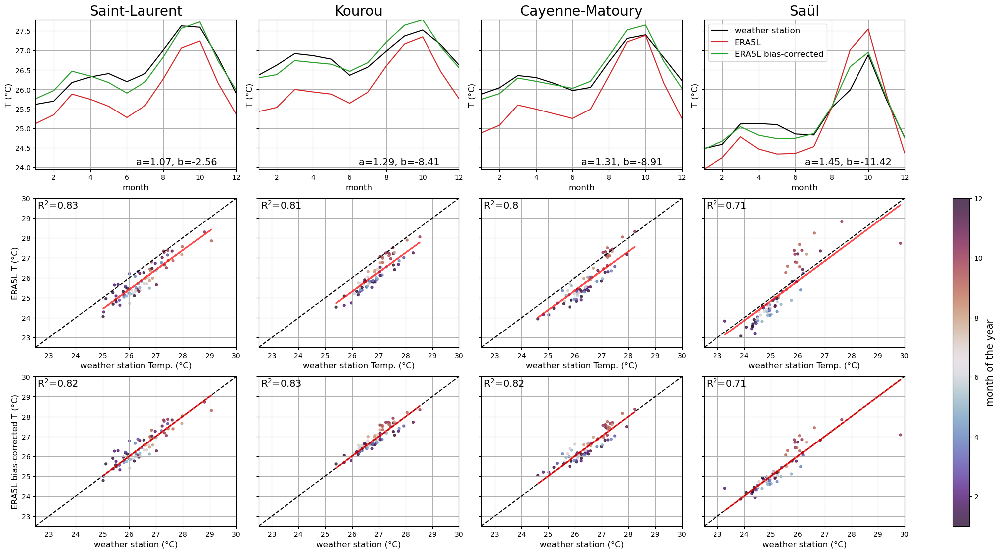

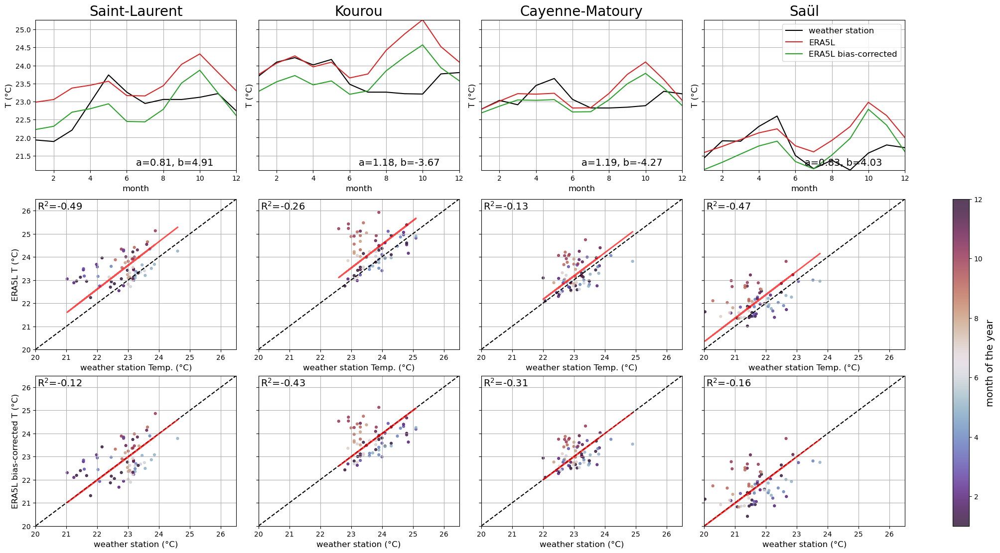

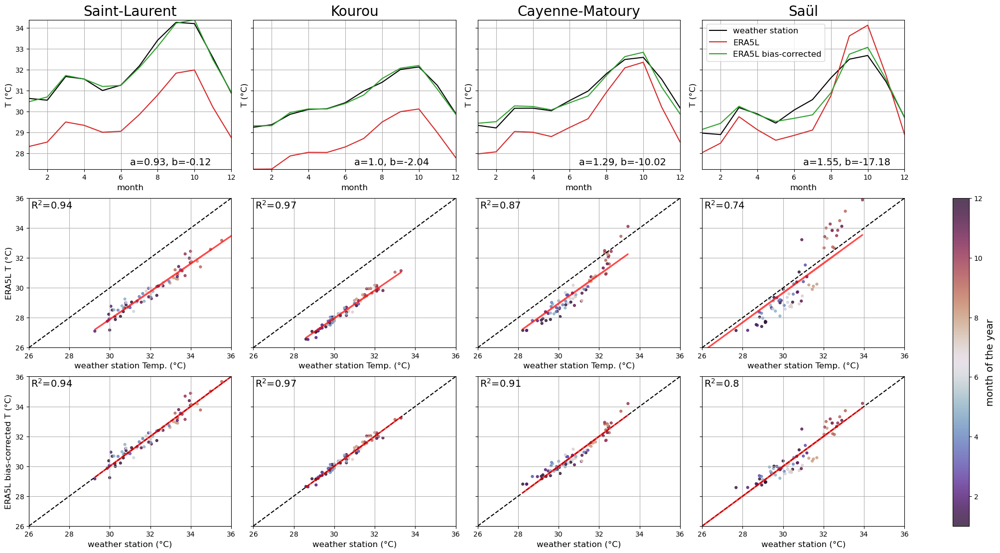

In [21]:
# compute monthly mean, min(5th percentile) and max(95th percentile) temeprature corrections for MF and for ERA5L and ERA5L mean bias corrected 

Locations=['Saint-Laurent','Kourou','Cayenne-Matoury','Saül']
idnames=['StLau','Kourou','CayMat','Saul']
M_corrections=[]
list_lims=[(22.5,30),(20,26.5),(26,36)]
list_vars=["Tmean","Tmin","Tmax"]

for l,stat in enumerate(['M','N','X']):
    print(stat)
    a_m=[]
    b_m=[]
    lims=list_lims[l]
    fig, ax = plt.subplots(3,4, figsize=(20,11),sharey='row', constrained_layout=True)

    for i,name in enumerate(idnames):
        #ERA_elr[name]=ERA_elr[name].reset_index().rename(columns={'valid_time':'date'})

        if stat=='M':
            tot=pd.concat([MF[name].reset_index().resample('M',on='date').mean(),ERA_elr[name].reset_index().resample('M',on='date').mean()],axis=1).dropna() # important to remove nan
        if stat=='N':
            tot=pd.concat([MF[name].reset_index().resample('M',on='date').quantile(0.05),ERA_elr[name].reset_index().resample('M',on='date').quantile(0.05)],axis=1).dropna() # important to remove nan
        if stat=='X':
            tot=pd.concat([MF[name].reset_index().resample('M',on='date').quantile(0.95),ERA_elr[name].reset_index().resample('M',on='date').quantile(0.95)],axis=1).dropna() # important to remove nan

        x,y=tot.iloc[:,0],tot.iloc[:,1]
        
        #define month colors
        col=[int(d) for d in MF[name].resample('M').mean().index.month]
        
        a=float(np.std(y)/np.std(x))
        b=float(np.mean(y)-a*np.mean(x))
        #y3=y+x.mean()-y.mean()
        y_cor=(y-b)/a

        # subplot 1
        ax[0,i].plot(x.groupby(x.index.month).mean(), c='k',alpha=1)
        ax[0,i].plot(y.groupby(y.index.month).mean(), c='C3',alpha=1)
        #ax[0,i].plot(y3.groupby(y3.index.month).mean(), c='purple',alpha=.8)
        ax[0,i].plot(y_cor.groupby(y_cor.index.month).mean(), c='C2',alpha=1)

        ax[0,i].set_xlabel('month',fontsize =12)
        ax[0,i].set_ylabel('T (°C)',fontsize =12)
        ax[0,i].set_title(Locations[i],fontsize =20)
        ax[0,i].text(0.5,0.03,'a='+str(round(a,2))+', '+'b='+str(round(b,2)),transform=ax[0,i].transAxes,fontsize =14)
        #ax[i].text(9,0.03,'bias='+str(round(mbias,2)),transform=ax[i].get_xaxis_transform(),fontsize =14)
        a_m.append(round(a,2))
        b_m.append(round(b,2))

        # subplot 2

        reg1 = LinearRegression(fit_intercept = False).fit(np.array(x).reshape(-1,1),y) #fit_intercept is set to false to force the intercept to be 0.
        scatter1=ax[1,i].scatter(x,y, s=12, alpha=.8, c=col, cmap='twilight_shifted')
        ax[1,i].axline((25, 25), slope=1,c='k', linestyle='--')
        ax[1,i].plot(x, reg1.predict(np.array(x).reshape(-1,1)), c='r', linewidth=2, alpha=.7)
        ax[1,i].text(0.01,0.93,'R$^2$='+str(round(reg1.score(np.array(x).reshape(-1,1),y),2)),transform=ax[1,i].transAxes, fontsize =14)
        ax[1,i].set_xlabel('weather station Temp. (°C)',fontsize =12)
        ax[1,i].set_xlim(lims)
        ax[1,i].set_ylim(lims)
        ax[0,i].margins(False)


        # subplot 3
        reg2 = LinearRegression(fit_intercept = False).fit(np.array(x).reshape(-1,1),y_cor)
        scatter2=ax[2,i].scatter(x,y_cor, s=12, alpha=.8, c=col, cmap='twilight_shifted')
        ax[2,i].axline((25, 25), slope=1,c='k', linestyle='--')
        ax[2,i].plot(x, reg2.predict(np.array(x).reshape(-1,1)), c='r', linewidth=2, alpha=.7)
        ax[2,i].text(0.01,0.93,'R$^2$='+str(round(reg2.score(np.array(x).reshape(-1,1),y_cor),2)),transform=ax[2,i].transAxes,fontsize =14)
        ax[2,i].set_xlabel('weather station (°C)',fontsize =12)
        ax[2,i].set_xlim(lims)
        ax[2,i].set_ylim(lims)

    [axs.grid() for axs in ax.flat]
    ax[0,i].legend(['weather station','ERA5L','ERA5L bias-corrected'],loc='best',fontsize =12)
    ax[1,0].set_ylabel('ERA5L T (°C)',fontsize =12)
    ax[2,0].set_ylabel('ERA5L bias-corrected T (°C)',fontsize =12)

    cax,kw = mpl.colorbar.make_axes([a for a in ax[1:,:].flat])
    cbar=plt.colorbar(scatter2, cax=cax, **kw)
    cbar.set_label('month of the year',fontsize =14)
    #plt.suptitle(list_vars[l])

    plt.savefig(figpath+'monthly_'+stat+'-ERA5L-MF_bias_2018-2024.png')
    M_corrections.append(pd.DataFrame(data=np.vstack((np.array(a_m),np.array(b_m))).T,columns=['a','b'],index=idnames))


M_corrections_tot=pd.concat({"Tmean": M_corrections[0], "Tmin": M_corrections[1],"Tmax": M_corrections[2]})
M_corrections_tot.to_csv(outputpath+'ERA-MF_monthly_corrections_2018-2024.csv')

M
N
X


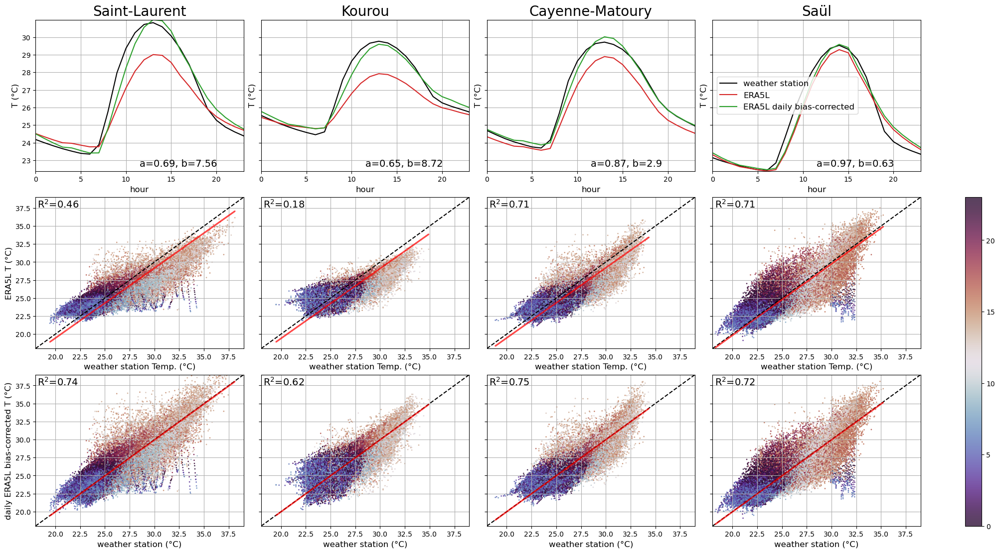

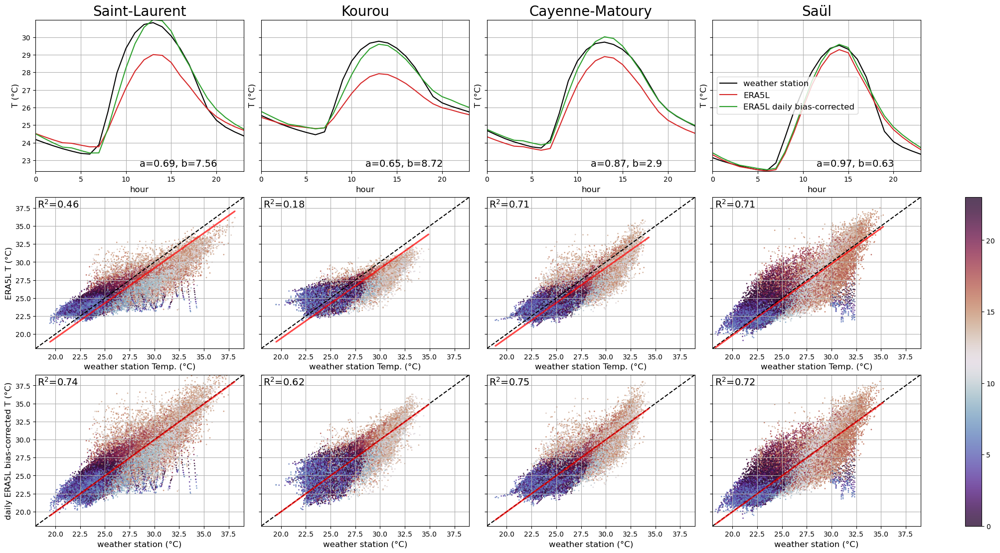

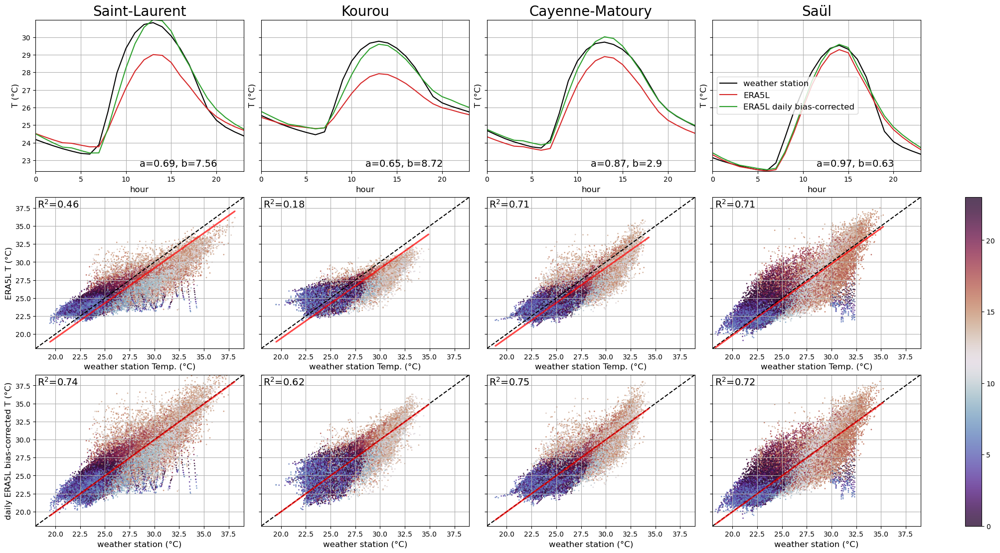

In [25]:
# compute hourly mean, min(5th percentile) and max(95th percentile) temeprature corrections for MF and for ERA5L and ERA5L mean bias corrected 

Locations=['Saint-Laurent','Kourou','Cayenne-Matoury','Saül']
idnames=['StLau','Kourou','CayMat','Saul']
H_corrections=[]
list_lims=[(18,39),(18,39),(18,39)]
list_vars=["Tmean","Tmin","Tmax"]

for l,stat in enumerate(['M','N','X']):
    print(stat)
    a_h=[]
    b_h=[]
    lims=list_lims[l]
    fig, ax = plt.subplots(3,4, figsize=(20,11),sharey='row', constrained_layout=True)

    for i,name in enumerate(idnames):
        
        if stat=='M':
            tot=pd.concat([MF[name].reset_index().resample('H',on='date').mean(),ERA_elr[name].reset_index().resample('H',on='date').mean()],axis=1).dropna() # important to remove nan
        if stat=='N':
            tot=pd.concat([MF[name].reset_index().resample('H',on='date').quantile(0.05),ERA_elr[name].reset_index().resample('H',on='date').quantile(0.05)],axis=1).dropna() # important to remove nan
        if stat=='X':
            tot=pd.concat([MF[name].reset_index().resample('H',on='date').quantile(0.95),ERA_elr[name].reset_index().resample('H',on='date').quantile(0.95)],axis=1).dropna() # important to remove nan

        x,y=tot.iloc[:,0],tot.iloc[:,1]
        
        #define month colors
        col=[int(d) for d in tot.iloc[:,0].index.hour]
        
        a=float(np.std(y)/np.std(x))
        b=float(np.mean(y)-a*np.mean(x))
        #y3=y+x.mean()-y.mean()
        y_cor=(y-b)/a

        # subplot 1
        ax[0,i].plot(x.groupby(x.index.hour).mean(), c='k',alpha=1)
        ax[0,i].plot(y.groupby(y.index.hour).mean(), c='C3',alpha=1)
        #ax[0,i].plot(y3.groupby(y3.index.month).mean(), c='purple',alpha=.8)
        ax[0,i].plot(y_cor.groupby(y_cor.index.hour).mean(), c='C2',alpha=1)

        ax[0,i].set_xlabel('hour',fontsize =12)
        ax[0,i].set_ylabel('T (°C)',fontsize =12)
        ax[0,i].set_title(Locations[i],fontsize =20)
        ax[0,i].text(0.5,0.03,'a='+str(round(a,2))+', '+'b='+str(round(b,2)),transform=ax[0,i].transAxes,fontsize =14)
        #ax[i].text(9,0.03,'bias='+str(round(mbias,2)),transform=ax[i].get_xaxis_transform(),fontsize =14)
        a_h.append(round(a,2))
        b_h.append(round(b,2))

        # subplot 2
        reg1 = LinearRegression(fit_intercept = False).fit(np.array(x).reshape(-1,1),y) #fit_intercept is set to false to force the intercept to be 0.
        scatter1=ax[1,i].scatter(x,y, s=1, alpha=.8, c=col, cmap='twilight_shifted')
        ax[1,i].axline((25, 25), slope=1,c='k', linestyle='--')
        ax[1,i].plot(x, reg1.predict(np.array(x).reshape(-1,1)), c='r', linewidth=2, alpha=.7)
        ax[1,i].text(0.01,0.93,'R$^2$='+str(round(reg1.score(np.array(x).reshape(-1,1),y),2)),transform=ax[1,i].transAxes, fontsize =14)
        ax[1,i].set_xlabel('weather station Temp. (°C)',fontsize =12)
        ax[1,i].set_xlim(lims)
        ax[1,i].set_ylim(lims)
        ax[0,i].margins(False)

        # subplot 3
        reg2 = LinearRegression(fit_intercept = False).fit(np.array(x).reshape(-1,1),y_cor)
        scatter2=ax[2,i].scatter(x,y_cor, s=1, alpha=.8, c=col, cmap='twilight_shifted')
        ax[2,i].axline((25, 25), slope=1,c='k', linestyle='--')
        ax[2,i].plot(x, reg2.predict(np.array(x).reshape(-1,1)), c='r', linewidth=2, alpha=.7)
        ax[2,i].text(0.01,0.93,'R$^2$='+str(round(reg2.score(np.array(x).reshape(-1,1),y_cor),2)),transform=ax[2,i].transAxes,fontsize =14)
        ax[2,i].set_xlabel('weather station (°C)',fontsize =12)
        ax[2,i].set_xlim(lims)
        ax[2,i].set_ylim(lims)

    [axs.grid() for axs in ax.flat]
    ax[0,i].legend(['weather station','ERA5L','ERA5L daily bias-corrected'],loc='best',fontsize =12)
    ax[1,0].set_ylabel('ERA5L T (°C)',fontsize =12)
    ax[2,0].set_ylabel('daily ERA5L bias-corrected T (°C)',fontsize =12)

    cax,kw = mpl.colorbar.make_axes([a for a in ax[1:,:].flat])
    cbar=plt.colorbar(scatter2, cax=cax, **kw)
    #cbar.set_label('hour of the day',fontsize =14)
    #plt.suptitle(list_vars[l])

    #plt.savefig(figpath+'monthly_'+stat+'-ERA5L-MF_bias_2018-2024.png')
    H_corrections.append(pd.DataFrame(data=np.vstack((np.array(a_h),np.array(b_h))).T,columns=['a','b'],index=idnames))


H_corrections_tot=pd.concat({"Tmean": H_corrections[0], "Tmin": H_corrections[1],"Tmax": H_corrections[2]})

H_corrections_tot.to_csv(outputpath+'ERA-MF_hourly_corrections_2018-2024.csv')

#### b. Compute ERA5-Land equivalent at sensor elevation using the ELR

In [30]:
# Dataframe of raw ERA values at forest site
ERA_f=pd.concat([era_nou['t2m'][:,0,0].to_dataframe()['t2m'],era_par['t2m'][:,0,0].to_dataframe()['t2m'],era_lau['t2m'][:,0,0].to_dataframe()['t2m'],era_ito['t2m'][:,0,0].to_dataframe()['t2m']],axis=1)
ERA_f.columns=['NOU','PAR','LAU','ITO']
ERA_f=ERA_f.reset_index().rename(columns={'valid_time':'date'}).set_index('date')


#l_id=df['Raw_data_identifier'].drop_duplicates()
l_id=df['Site_id'].drop_duplicates() #we consider only PM not individual loggers

ERA_f_elr=pd.DataFrame(columns=l_id)

# if altitude correction
for i,lid in enumerate(l_id):
    #f=df[df['Raw_data_identifier']==lid]['ForestName'].values[0]
    f=df[df['Site_id']==lid]['ForestName'].values[0]
    #z_pm=df[df['Raw_data_identifier']==lid]['Elevation'].drop_duplicates().values[0] # altitude of point measurement
    z_pm=float(m[m['Site_id']==lid]['Elevation'].values[0]) # altitude of point measurement
    z_era=Site_loc.loc[f,'ERA5L_alt'] # altitude of ERA grid
    ERA_f_elr[lid] = ERA_f[f] + ELR * (z_pm-z_era)

#ERA_f_elr.to_csv(outputpath+'/../ERA5L_elr_at_PM.csv')

#### c. Debias ERA5-Land 

In [33]:
# open monthly corrections
ForestNames=['NOU','PAR','LAU','ITO']
f2ws=dict(zip(ForestNames,['CayMat','Kourou','StLau','Saul']))

# create ERA corrected dataframe
ERA_elr_hm_M=ERA_f_elr.copy(deep=True) # for mean T
ERA_elr_hm_X=ERA_f_elr.copy(deep=True) # for maxT

for i,lid in enumerate(l_id):

    f=df[df['Site_id']==lid]['ForestName'].values[0]
    # Then apply the correction
    
    ERA_elr_hm_M[lid] = (ERA_f_elr[lid] - H_corrections_tot.loc[('Tmean',f2ws[f]),"b"]) / H_corrections_tot.loc[('Tmean',f2ws[f]),"a"]
    # Then apply the monthly correction
    ERA_elr_hm_M[lid] = (ERA_elr_hm_M[lid] - M_corrections_tot.loc[('Tmean',f2ws[f]),"b"]) / M_corrections_tot.loc[('Tmean',f2ws[f]),"a"]
    
    #Tmax
    # apply the hourly correction
    ERA_elr_hm_X[lid] = (ERA_f_elr[lid] - H_corrections_tot.loc[('Tmax',f2ws[f]),"b"]) / H_corrections_tot.loc[('Tmax',f2ws[f]),"a"]
    # Then apply the monthly correction
    ERA_elr_hm_X[lid] = (ERA_elr_hm_X[lid] - M_corrections_tot.loc[('Tmax',f2ws[f]),"b"]) / M_corrections_tot.loc[('Tmax',f2ws[f]),"a"]

In [35]:
# Add the debiased ERA5-Land temperature in the main dataframe
df=df.set_index('date')
df['erachm_M']=pd.Series(dtype=float) #test.set_index(['date','Raw_data_identifier'])
df['erachm_X']=pd.Series(dtype=float) #test.set_index(['date','Raw_data_identifier'])

for id in l_id:
    dindices=list(df[df['Site_id']==id].index)
    #df.loc[df['Raw_data_identifier']==id,'erac'] = ERA_f_elr_m[ERA_f_elr_m[id].index.isin(dindices)][id]
    #df.loc[df['Raw_data_identifier']==id,'erach'] = ERA_f_elr_h[ERA_f_elr_h[id].index.isin(dindices)][id]
    df.loc[df['Site_id']==id,'erachm_M'] = ERA_elr_hm_M[ERA_elr_hm_M[id].index.isin(dindices)][id]
    df.loc[df['Site_id']==id,'erachm_X'] = ERA_elr_hm_X[ERA_elr_hm_X[id].index.isin(dindices)][id]

df['erachm_M']=df['erachm_M'].astype(float)
df['erachm_X']=df['erachm_X'].astype(float)

df=df.reset_index()

df['offsethm']=df['Tair']-df['erachm_M'] # temperature offset with hourly+monthly corrections

## 4) Results

### Figure 2

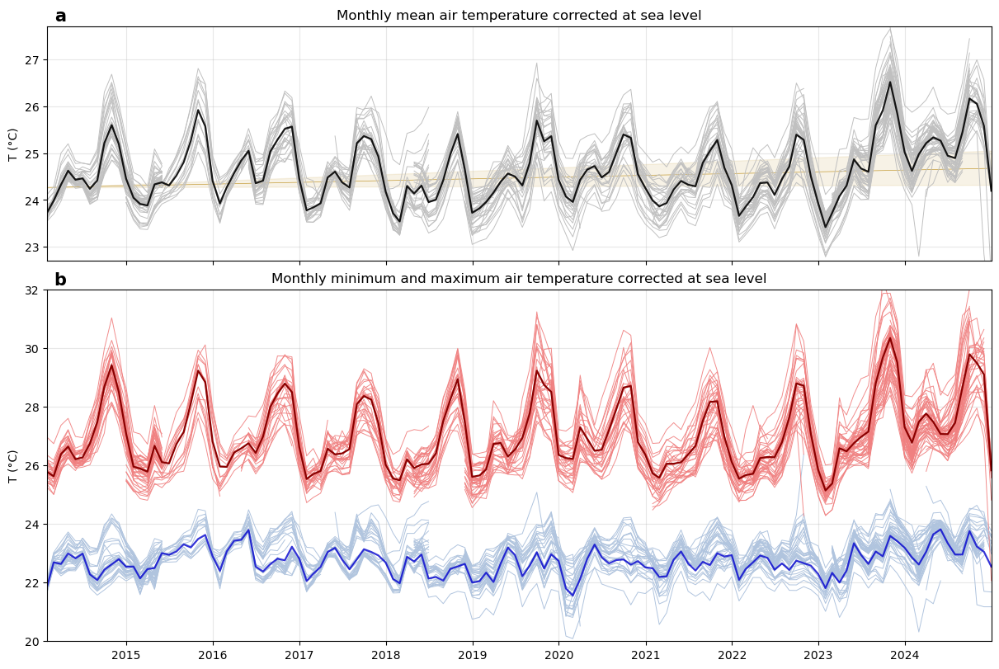

In [41]:
fig, ax=plt.subplots(2,1, sharex=True, figsize=(12, 8),gridspec_kw={'height_ratios': [1, 1.5]}, layout='constrained')
df=df.set_index('Site_id')
for sid in df.index.drop_duplicates():   
    dm=df.loc[sid,['date','Tair_sl']].resample('M', on='date').mean()
    dx=df.loc[sid,['date','Tair_sl']].resample('M', on='date').quantile(0.95)
    dn=df.loc[sid,['date','Tair_sl']].resample('M', on='date').quantile(0.05)

    ax[0].plot(dm,linewidth=.7, alpha=1, c='silver')
    ax[1].plot(dn,linewidth=.7, alpha=1, c='lightsteelblue')
    ax[1].plot(dx,linewidth=.7, alpha=.9, c='lightcoral')

TM=df.loc[:,['date','Tair_sl']].resample('M', on='date').mean()
TN=df.loc[:,['date','Tair_sl']].resample('M', on='date').quantile(0.05)
TX=df.loc[:,['date','Tair_sl']].resample('M', on='date').quantile(0.95)

## test plot theilsen slope
x=np.arange(len(TM))
ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(TM)  # Note the additional underscores (_) to ignore the last three return values
ax[0].plot(TM.index, ts_slope * x + ts_inter, linestyle='-', alpha=.8, color='darkgoldenrod', linewidth=.5,zorder=1)
ax[0].fill_between(TM.index, ts_ls * x + ts_inter, ts_hs * x + ts_inter, color='darkgoldenrod', alpha=.1,zorder=1)
##

ax[0].plot(TM,c='k', linewidth=1.6, alpha=.9)
ax[1].plot(TN,c='mediumblue', linewidth=1.6, alpha=.8)
ax[1].plot(TX,c='darkred', linewidth=1.6, alpha=1)

ax[0].set_title('Monthly mean air temperature corrected at sea level')
ax[1].set_title('Monthly minimum and maximum air temperature corrected at sea level')

[axes.grid(alpha=.3) for axes in ax]
#[axes.get_legend().remove() for axes in ax]
[axes.margins(False) for axes in ax]

ax[0].set_ylim(22.7,27.7)
ax[1].set_ylim(20,32)

ax[0].text(0.02, 1.08, 'a', transform=ax[0].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') 
ax[1].text(0.02, 1.05, 'b', transform=ax[1].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') 

[ax[i].set_ylabel('T (°C)') for i in range(2)]
plt.savefig(figpath+'fig_2.png')
    

In [42]:
# define a dataframe for statistics
av=['Tmean','Tmin','Tmax']
slo=['Tmean slope','Tmin slope','Tmax slope']
t_sum=pd.DataFrame(columns=[av+slo], index=['Understory microclimate','Kourou macroclimate']) 

# compute Theilsen trend for microclimate
for i,temp in enumerate([TM,TN,TX]):
    ts_slope, ts_inter, ts_ls, ts_hs=Theilsen(temp.reset_index())
    t_sum.loc['Understory microclimate',av[i]]=str(np.round(temp.mean().values[0],1))+'+/-'+str(np.round(temp.std().values[0],1))
    t_sum.loc['Understory microclimate',slo[i]]=str(np.round(ts_slope,3))+' ['+str(np.round(ts_ls,3))+','+str(np.round(ts_hs,3))+']'

# compute Theilsen trend for Kourou weather station
MFK=pd.read_csv(inputpath+'MF_kourouCSG_2010-2025_clean.csv',parse_dates=[1]).rename(columns={'T':'Tair'}).drop(columns='Unnamed: 0').set_index('date')
d0,d1='2014-01-01 00:00:00','2024-12-31 00:00:00'
Tm=MFK.loc[d0:d1].resample('M').mean(numeric_only=True).reset_index()
for i,temp in enumerate(['Tair','TN','TX']):
    ts_slope, ts_inter, ts_ls, ts_hs=Theilsen(Tm[temp].reset_index())
    t_sum.loc['Kourou macroclimate',av[i]]=str(np.round(Tm[temp].mean(),1))+'+/-'+str(np.round(Tm[temp].std(),1))
    t_sum.loc['Kourou macroclimate',slo[i]]=str(np.round(ts_slope,3))+' ['+str(np.round(ts_ls,3))+','+str(np.round(ts_hs,3))+']'
    
dfi.export(t_sum, outputpath+'stat_table_T_sl_2014-2024.png',table_conversion='selenium')
t_sum

,Tmean,Tmin,Tmax,Tmean slope,Tmin slope,Tmax slope
Understory microclimate,24.6+/-0.6,22.7+/-0.4,27.0+/-1.2,"0.037 [0.005,0.072]","0.015 [-0.01,0.04]","0.061 [0.004,0.119]"
Kourou macroclimate,26.7+/-0.6,26.4+/-0.6,27.1+/-0.6,"0.061 [0.03,0.093]","0.062 [0.031,0.093]","0.061 [0.028,0.094]"


### Figure 3

24.451592292811902 23.476959446352943
2.0771267709618817 1.4606221365841023


[None, None]

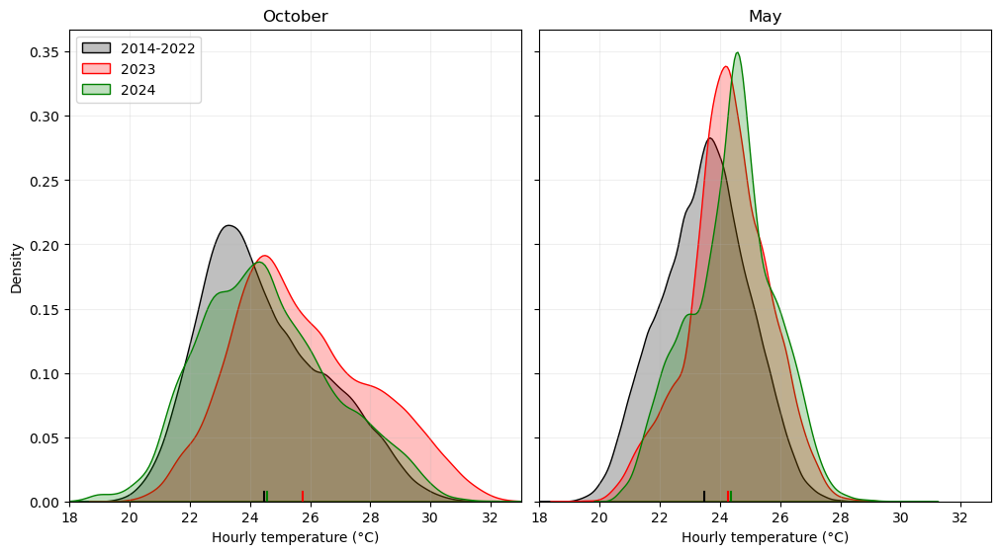

In [45]:
# select may and october month for the old period (2014-2022) and year 2023
may_old=df[(df['date'].dt.month==5)&(df['date'].dt.year<2023)]
may_23=df[(df['date'].dt.month==5)&(df['date'].dt.year>=2023)]
oct_old=df[(df['date'].dt.month==10)&(df['date'].dt.year<2023)]
oct_23=df[(df['date'].dt.month==10)&(df['date'].dt.year>=2023)]

# creaate figure

fig,ax=plt.subplots(1,2, figsize=(10,5.5), sharey=True,sharex=True, layout='constrained')
may_old=df[(df['date'].dt.month==5)&(df['date'].dt.year<2023)]
may_23=df[(df['date'].dt.month==5)&(df['date'].dt.year==2023)]
may_24=df[(df['date'].dt.month==5)&(df['date'].dt.year==2024)]
oct_old=df[(df['date'].dt.month==10)&(df['date'].dt.year<2023)]
oct_23=df[(df['date'].dt.month==10)&(df['date'].dt.year==2023)]
oct_24=df[(df['date'].dt.month==10)&(df['date'].dt.year==2024)]

sns.kdeplot(oct_old['Tair'], fill=True, color="k", ax=ax[0])
sns.kdeplot(oct_23['Tair'], fill=True, color="r", ax=ax[0])
sns.kdeplot(oct_24['Tair'], fill=True, color="g", ax=ax[0])
sns.kdeplot(may_old['Tair'], fill=True, color="k", ax=ax[1])
sns.kdeplot(may_23['Tair'], fill=True, color="r", ax=ax[1])
sns.kdeplot(may_24['Tair'], fill=True, color="g", ax=ax[1])

print(oct_old['Tair'].mean(),may_old['Tair'].mean())
print(oct_old['Tair'].std(),may_old['Tair'].std())

ax[0].axvline(x=oct_old['Tair'].mean(), ymin=0, ymax=0.02,c="k")
ax[1].axvline(x=may_old['Tair'].mean(), ymin=0, ymax=0.02,c="k")
ax[0].axvline(x=oct_23['Tair'].mean(), ymin=0, ymax=0.02,c="r")
ax[1].axvline(x=may_23['Tair'].mean(), ymin=0, ymax=0.02,c="r")
ax[0].axvline(x=oct_24['Tair'].mean(), ymin=0, ymax=0.02,c="g")
ax[1].axvline(x=may_24['Tair'].mean(), ymin=0, ymax=0.02,c="g")

ax[0].set(ylabel=None)
ax[1].set(ylabel=None)

ax[0].legend(['2014-2022','2023','2024'],loc='upper left')
ax[0].set_xlim(18,33)
ax[0].set_title('October')
ax[1].set_title('May')
ax[0].set_ylabel('Density')
ax[0].set_ylabel('Density')
ax[0].set_xlabel('Hourly temperature (°C)')
ax[1].set_xlabel('Hourly temperature (°C)')
[a.grid(alpha=.2) for a in ax]
#plt.savefig(figpath+'fig_3.png')

In [47]:
# compute novelty index using hourly data and random sampling across 2014-2022 period

# 1) define the number of samples based on 2023 and 2024 minimum number of samples
nsample=min(len(oct_23),len(oct_24),len(may_23),len(may_24))

# 2) Radom sample the historical period and loop over the seasons
old=[oct_old,may_old]
   
novelties=[[],[],[],[]]
seasons=['oct_23', 'oct_24', 'may_23', 'may_24']
for i,dnew in enumerate([oct_23, oct_24, may_23, may_24]):
	print(seasons[i])
	dhist=old[int(i/2)]['Tair']
	for k in range(100):
		x0=np.random.choice(dhist, size=nsample)  # choose random sensors
		x1 = dnew['Tair']
		kde0 = gaussian_kde(x0, bw_method=0.3)
		kde1 = gaussian_kde(x1, bw_method=0.3)

		xmin = min(x0.min(), x1.min())
		xmax = max(x0.max(), x1.max())
		dx = 0.2 * (xmax - xmin) # add a 20% margin, as the kde is wider than the data
		xmin -= dx
		xmax += dx

		x = np.linspace(xmin, xmax, 500)
		kde0_x = kde0(x)
		kde1_x = kde1(x)
		inters_x = np.minimum(kde0_x, kde1_x)
		area_inters_x = np.trapz(inters_x, x)
		novelty=1-area_inters_x

		novelties[i].append(novelty)
print('novelty_indices = '+str([np.round(np.mean(novelties[i]),2) for i in range(4)]))

oct_23
oct_24
may_23
may_24
novelty_indices = [0.22, 0.06, 0.22, 0.25]


### Figure 4

In [54]:
# compute anomaly and total variance  
anomean,anomax,anomin=pd.Series(dtype='float64'),pd.Series(dtype='float64'),pd.Series(dtype='float64')
ts_m=df.loc[:,['date','Tair_sl']].resample('M', on='date').mean()
ts_x=df.loc[:,['date','Tair_sl']].resample('M', on='date').quantile(.95)
ts_n=df.loc[:,['date','Tair_sl']].resample('M', on='date').quantile(.05)

for k,pmid in enumerate(df.index.drop_duplicates()):
    am= df.loc[pmid,['date','Tair_sl']].resample('M', on='date').mean() - ts_m
    ax= df.loc[pmid,['date','Tair_sl']].resample('M', on='date').quantile(.95) - ts_x
    an= df.loc[pmid,['date','Tair_sl']].resample('M', on='date').quantile(.05) - ts_n
    anomean = pd.concat([anomean,am],axis=1)
    anomax= pd.concat([anomax,ax],axis=1)
    anomin = pd.concat([anomin,an],axis=1)

[k.drop(columns=0, inplace=True) for k in [anomean,anomax,anomin]]
#anom.to_csv(outputpath+'deviation-from-mean_per-MP.csv')

anomean=anomean.stack().reset_index().rename(columns={0:'Anom'})
anomax=anomax.stack().reset_index().rename(columns={0:'Anom'})
anomin=anomin.stack().reset_index().rename(columns={0:'Anom'})
print(anomean.std(numeric_only=True))

Anom    0.359732
dtype: float64


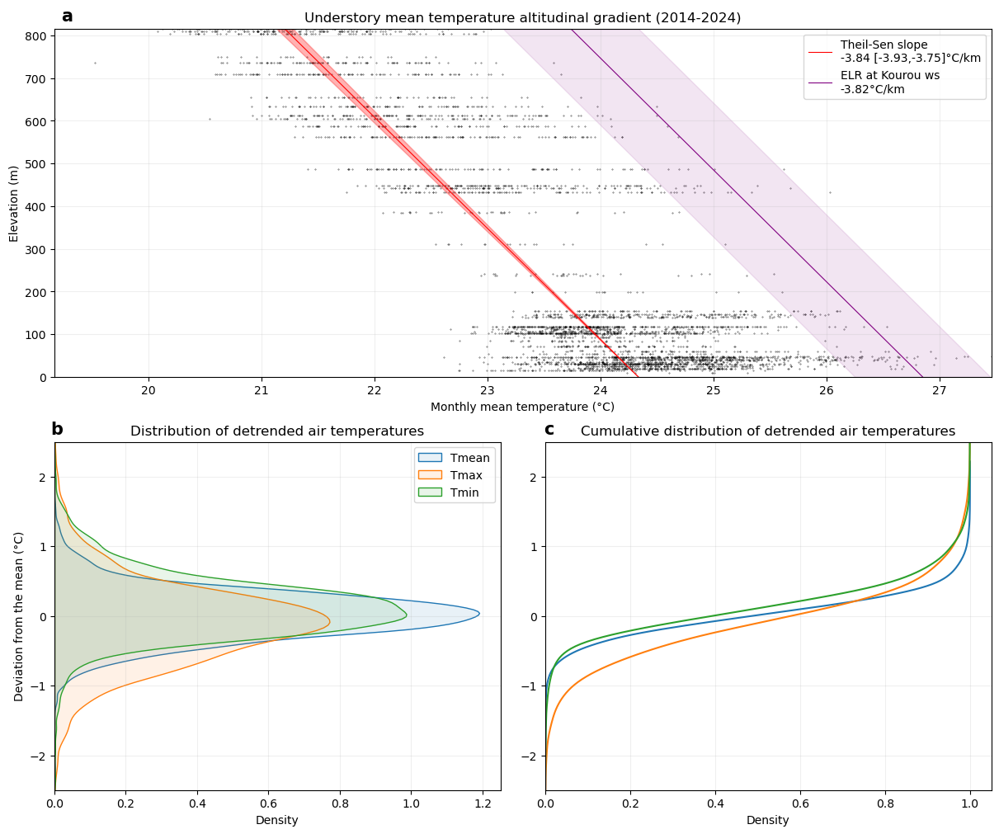

In [55]:
# create figure 4
xtot=[]
xms=[]
yms=[]
lbl=['a','b','c']

fig, ax=plt.subplot_mosaic("aa;bc",figsize=(12, 10), layout="constrained")

# subplot 1

for pmid in df.index.drop_duplicates():   
    x=df.loc[pmid,['date','Tair']].resample('M', on='date').mean()
    y=[int(df.loc[pmid,'Elevation'].values[0])]*len(x)
    #xms.append(df.loc[pmid,'Tair'].mean())
    #yms.append(int(df.loc[pmid,'Elevation'].values[0]))
    x['Altitude']=y
    xtot.append(x)

dtot=pd.concat(xtot).dropna()
dtot.plot.scatter('Tair','Altitude',s=.1, ax=ax["a"],color="k",alpha=.8)

# theilslope
ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(dtot['Tair'],dtot['Altitude'])  # Note the additional underscores (_) to ignore the last three return values
ys=np.arange(0,np.max(dtot['Altitude']),np.max(dtot['Altitude'])-1)

ax["a"].plot(ts_slope*ys+ts_inter,ys, c='r', linewidth=.8, label='Theil-Sen slope \n'+ str(round(ts_slope*1000,2))+' ['+str(round(ts_ls*1000,2))+','+str(round(ts_hs*1000,2))+']°C/km')
#ax.plot(ts_hs*ys+ts_inter,ys, c='r',linewidth=.5, label='Theil-Sen slope \n'+ str(round(ts_slope*1000,2))+'['+str(round(ts_ls*1000,2))+','+str(round(ts_hs*1000,2))+']°C/km')
#ax.plot(ts_ls*ys+ts_inter,ys, c='r',linewidth=.5)
ax["a"].fill_betweenx(ys,ts_ls*ys+ts_inter,ts_hs*ys+ts_inter, alpha=.3,color='r')


# plot Kourou weather station and outside forest lapse rate
MFk=MF_Kourou[MF_Kourou.index>'2014-01-01']['Tair']
mean=MFk.resample('M').mean().mean()
std=MFk.resample('M').mean().std()

xx=ELR*ys+mean
ax["a"].plot(xx,ys, c='purple',linewidth=.8, label='ELR at Kourou ws \n'+ str(round(ELR*1000,2))+'°C/km')
ax["a"].fill_betweenx(ys,xx-std,xx+std, color='purple', alpha=.1)
ax["a"].set_xlabel('Monthly mean temperature (°C)')
ax["a"].set_ylabel('Elevation (m)')
ax["a"].margins(False)
ax["a"].legend()
ax["a"].set_title('Understory mean temperature altitudinal gradient (2014-2024)')


# subplot2 
sns.kdeplot(anomean, y='Anom', fill=True, alpha=.1, label='Tmean', ax=ax["b"])
sns.kdeplot(anomax, y='Anom', fill=True, alpha=.1, label='Tmax', ax=ax["b"])
sns.kdeplot(anomin, y='Anom', fill=True, alpha=.1, label='Tmin', ax=ax["b"])

sns.kdeplot(anomean, y='Anom', cumulative=True, ax=ax["c"])
sns.kdeplot(anomax, y='Anom', cumulative=True,  ax=ax["c"])
sns.kdeplot(anomin, y='Anom', cumulative=True, ax=ax["c"])
#ax[1].axvline(0.9)
ax["b"].set_ylabel('Deviation from the mean (°C)')
ax["b"].legend()
ax["b"].set_ylim(-2.5,2.5)
ax["b"].set_title('Distribution of detrended air temperatures')

#ax["c"].set_ylim(-2.5,2.5)
[ax[k].grid(alpha=.2) for k in lbl]
[ax[k].text(0.02, 1.06, k, 
            transform=ax[k].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') for k in lbl]
ax["c"].sharey(ax['b'])
ax["c"].set_ylabel('')
ax["c"].set_title('Cumulative distribution of detrended air temperatures')

plt.savefig(figpath+'fig_4.png')

### Figure 5

NOU
PAR
LAU
ITO1
ITO2
ITO3


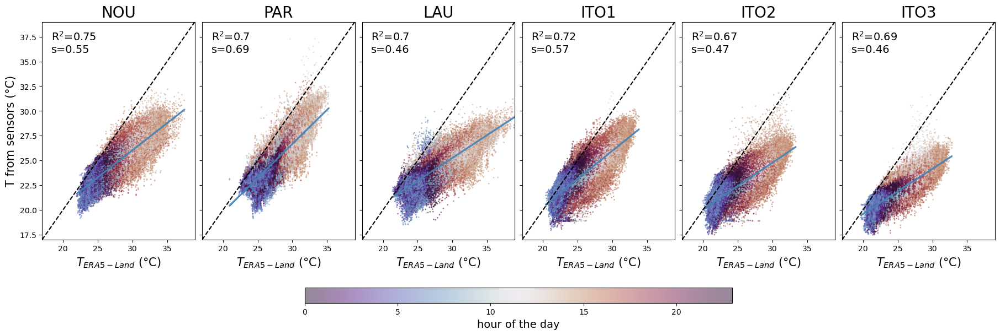

In [58]:
### Plot scatterplot hourly+monthly debiased ERA5-Land and microclimate for Long term sensors

fig, ax = plt.subplots(1,6, sharey=True, sharex=True, figsize=(18,6),constrained_layout=True)
ForestClasses=['NOU','PAR','LAU','ITO1','ITO2','ITO3']
lims=(17,39)

for i,n in enumerate(ForestClasses):
    print(n)

    # select data
    subset=df[(df['ForestClass']==n)&(df['LongTermPM']==True)][['date','Tair','erachm_M']].dropna().set_index('date')  # df['LongTermPM']==True)
    macro=subset['erachm_M']
    micro=subset['Tair']

    col=[float(d.strftime('%H')) for d in micro.index.time]  # use micro.index.year to sea yearly changes
 
    #linear regression
    x,y= macro.values.reshape(-1,1), micro.values
    reg = LinearRegression().fit(x,y)
    scatter=ax[i].scatter(x,y,s=1, alpha=.5, c=col, cmap='twilight_shifted')
    ax[i].plot(x, reg.predict(x),c='steelblue',linewidth=2,alpha=.9)
    ax[i].axline((0, 0), slope=1,c='k', linestyle='--')
    ax[i].set_xlim(lims)
    ax[i].set_ylim(lims)
    ax[i].set_xlabel('$T_{ERA5-Land}$ (°C)',fontsize =15)
    ax[i].set_title(n,fontsize =20)
    ax[i].text(0.06,0.86,'R$^2$='+str(round(reg.score(x,y),2))+'\ns='+str(round(reg.coef_[0],2)),
               fontsize =14, transform=ax[i].transAxes)
ax[0].set_ylabel('T from sensors (°C)',fontsize =15)
cax,kw = mpl.colorbar.make_axes([a for a in ax.flat], location='bottom', orientation='horizontal', 
                                pad=0.08, aspect=28, fraction=0.07)
cbar=plt.colorbar(scatter, cax=cax, orientation='horizontal')
cbar.set_label('hour of the day',fontsize =14)

plt.savefig(figpath+'fig_5.png')

### Figure 6

In [66]:
####### create monthly mean/max microclimate and offset #######
######################################################
df=df.reset_index()
dfm=df.set_index('date').groupby(['Site_id','Raw_data_identifier','ForestName', 'Elevation', 'ForestClass', 'LongTermPM']).resample('MS').mean(numeric_only=True)['Tair'].reset_index()#.set_index('date') #.rename(columns={'Tair':'Tmean'})
dfm['Tmax']=df.set_index('date').groupby(['Site_id','Raw_data_identifier','ForestName', 'Elevation', 'ForestClass', 'LongTermPM']).resample('MS').quantile(0.95, numeric_only=True)['Tair'].reset_index()['Tair']#.set_index('date')['Tair'] #.rename(columns={'Tair':'Tmean'})
dfm=dfm.rename(columns={'Tair':'Tmean'})

###############################################
# remove months with too little data for Itoupé
dfm=dfm[~((dfm['ForestName']=='ITO') & (dfm['date'].dt.year==2018) & (dfm['date'].dt.month==6)) & ~ ((dfm['ForestName']=='ITO') & (dfm['date'].dt.year==2018) & (dfm['date'].dt.month==11))]

dfm=dfm.set_index('date')
dfm.index=pd.to_datetime(dfm.index, format = '%Y/%m').strftime('%Y-%m')

# take the monthly mean for ERA
ERA_elr_hm_M=ERA_elr_hm_M.resample('MS').mean()
ERA_elr_hm_M.index=pd.to_datetime(ERA_elr_hm_M.index, format = '%m/%Y').strftime('%Y-%m')

ERA_elr_hm_X=ERA_elr_hm_X.resample('MS').quantile(0.95) #.mean()
ERA_elr_hm_X.index=pd.to_datetime(ERA_elr_hm_X.index, format = '%m/%Y').strftime('%Y-%m')

for id in l_id:
    #dindices=list(dfm[dfm['Raw_data_identifier']==id].index)   
    dindices=list(dfm[dfm['Site_id']==id].index)

    #dfm.loc[dfm['Raw_data_identifier']==id,'erac'] = ERAc_elr[ERAc_elr[id].index.isin(dindices)][id]
    #dfm.loc[dfm['Raw_data_identifier']==id,'samet'] = SAMET_elr[SAMET_elr[id].index.isin(dindices)][id]
    dfm.loc[dfm['Site_id']==id,'erac_Tmean'] = ERA_elr_hm_M[ERA_elr_hm_M[id].index.isin(dindices)][id]
    dfm.loc[dfm['Site_id']==id,'erac_Tmax'] = ERA_elr_hm_X[ERA_elr_hm_X[id].index.isin(dindices)][id]
    
# create offset column
dfm["offset_Tmean"]=dfm["Tmean"].subtract(dfm["erac_Tmean"])
dfm["offset_Tmax"]=dfm["Tmax"].subtract(dfm["erac_Tmax"])

dfm=dfm.reset_index()
dfm['date']=pd.to_datetime(dfm['date'])
print('finished')

finished


NOU
PAR
LAU
ITO


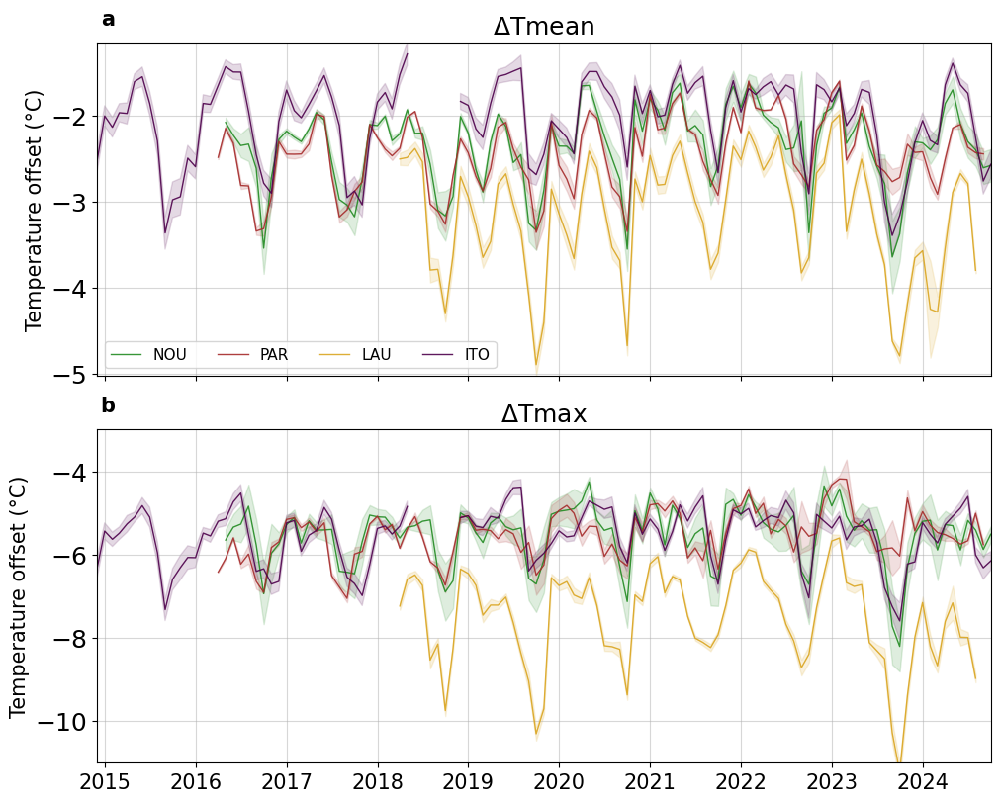

In [68]:
###### Final Plot ######
# change ForestName to ForestClass to get a plot with ITOUPE different altitudes

# create color set
from  matplotlib import colors
c=[]
for k in ['forestgreen','brown','goldenrod']:
    c.append(colors.to_rgba(k))
c=np.concatenate([np.array(c), mpl.colormaps['BuPu_r'](np.array([0 , 0.3, 0.6 ]))],axis=0)

ForestClass=['NOU','PAR','LAU','ITO1','ITO2','ITO3']

# Subplot
t_sum=pd.DataFrame(columns=[r'$\Delta$Tmean',r'$\Delta$Tmax',r'$\Delta$Tmean slope',r'$\Delta$Tmax slope'], index=ForestClass) 

lbl=['a','b','c']
ForestCol=dict(zip(ForestNames,c))
colline=['forestgreen','brown','goldenrod','indigo'] #,'blue']
titles=[r'$\Delta$Tmean',r'$\Delta$Tmax']

sub='LT'
fig,ax=plt.subplots(2, sharex=True, figsize=(10,8), layout="constrained")
for i,n in enumerate(ForestNames):
    print(n)
    if sub=='LT':
        s=dfm[(dfm['ForestName']==n) & dfm['LongTermPM']]
    elif sub=='ST':
        s=dfm[(dfm['ForestName']==n) & dfm['LongTermPM']==False]
    else:
        s=dfm[(dfm['ForestName']==n)]
        
    # select data
    of_M_sem=s[['date','offset_Tmean']].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).mean().reset_index(drop=False)       
    of_M=s[['date','offset_Tmean']].groupby(pd.Grouper(key='date',freq='MS'))['offset_Tmean'].mean().reset_index()  

    of_X_sem=s[['date','offset_Tmax']].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).mean().reset_index(drop=False)       
    of_X=s[['date','offset_Tmax']].groupby(pd.Grouper(key='date',freq='MS'))['offset_Tmax'].mean().reset_index()  
    
        # Subplot 2: offset mean
    ax[0].plot(of_M['date'],of_M['offset_Tmean'], color=c[i], alpha=.9, lw=1, label=n) # +', m='+str(np.round(s[var].mean(),2))
    ax[0].fill_between(of_M['date'],of_M['offset_Tmean']-of_M_sem['offset_Tmean'],of_M['offset_Tmean']+of_M_sem['offset_Tmean'], alpha=0.15, color=ForestCol[n], zorder=1)
       
        # Subplot 3: offset max
    ax[1].plot(of_X['date'],of_X['offset_Tmax'], color=c[i], alpha=.9, lw=1, label=n) # +', m='+str(np.round(s[var].mean(),2))
    ax[1].fill_between(of_X['date'],of_X['offset_Tmax']-of_X_sem['offset_Tmax'],of_X['offset_Tmax']+of_X_sem['offset_Tmax'], alpha=0.15, color=ForestCol[n], zorder=1)

           
    # Theil Sen regression
    subset=of_M.dropna()
    x=np.arange(len(subset.index))
    y=np.array(subset.iloc[:,1])
    ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return values
    #save the values
    t_sum.loc[n,[r'$\Delta$Tmean']]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1))
    t_sum.loc[n,[r'$\Delta$Tmean slope']]=str(np.round(ts_slope*12,3))+' ['+str(np.round(ts_ls*12,3))+','+str(np.round(ts_hs*12,3))+']'
        
    # Theil Sen regression
    subset=of_X.dropna()
    x=np.arange(len(subset.index))
    y=np.array(subset.iloc[:,1])
    ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return value
    #save the values
    t_sum.loc[n,[r'$\Delta$Tmax']]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1))
    t_sum.loc[n,[r'$\Delta$Tmax slope']]=str(np.round(ts_slope*12,2))+' ['+str(np.round(ts_ls*12,2))+','+str(np.round(ts_hs*12,2))+']'
    
for i,a in enumerate(ax):
    a.margins(False)
    a.grid(alpha=.5)
    a.tick_params(axis='y', labelsize=18)
    a.set_title(titles[i], fontsize=18)
    
ax[0].set_ylabel('Temperature offset (°C)',fontsize=15)
ax[1].set_ylabel('Temperature offset (°C)',fontsize=15)

[ax[k].text(0.02, 1.1, lbl[k], 
            transform=ax[k].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') for k in range(2)]

ax[0].legend(loc='best',fontsize=11,  ncol = 6)
plt.xticks(fontsize=15)
ax[1].set_ylim(-11,-3)
t_sum.to_csv(outputpath+'offset_theil_sen_slopes_'+sub+'_10-2018-to-10-2024_table_summary.csv')
# save table as image
dfi.export(t_sum, figpath+'offset_theil_sen_slopes_'+sub+'_10-2018-to-10-2024_table_summary.png',table_conversion='selenium')
plt.savefig(figpath+'fig_7.png', dpi=300)


In [176]:
dfm.describe().round(1) 

,Elevation,Tmean,Tmax,erac_Tmean,erac_Tmax,offset_Tmean,offset_Tmax
count,4591.0,4562.0,4562.0,4546.0,4546.0,4517.0,4517.0
mean,252.2,23.7,26.0,26.0,31.7,-2.3,-5.7
std,268.7,1.3,1.8,1.6,2.2,0.6,1.1
min,9.0,19.2,19.8,22.3,27.4,-5.4,-11.6
25%,44.8,22.9,24.9,24.9,30.0,-2.6,-6.2
50%,112.0,23.9,26.0,26.1,31.6,-2.2,-5.5
75%,487.0,24.6,27.1,27.0,33.0,-1.9,-5.0
max,816.0,27.5,32.3,30.5,40.1,-0.2,-2.5


In [174]:
t_sum

,$\Delta$Tmean,$\Delta$Tmax,$\Delta$Tmean slope,$\Delta$Tmax slope
NOU,-2.3+/-0.5,-5.5+/-0.7,"0.023 [-0.013,0.055]","0.01 [-0.03,0.06]"
PAR,-2.4+/-0.4,-5.5+/-0.6,"0.042 [0.006,0.074]","0.07 [0.02,0.12]"
LAU,-3.2+/-0.7,-7.5+/-1.1,"-0.012 [-0.099,0.076]","-0.08 [-0.23,0.05]"
ITO1,-1.7+/-0.4,-5.0+/-0.6,"0.025 [-0.0,0.05]","0.04 [-0.0,0.09]"
ITO2,-2.2+/-0.5,-5.9+/-0.7,"0.024 [-0.012,0.056]","0.05 [0.0,0.09]"
ITO3,-2.5+/-0.6,-6.2+/-0.9,"0.019 [-0.023,0.066]","0.05 [-0.01,0.11]"


### Statistics

In [70]:
# seasonal temperature range for years before 2023
dfm=df.resample('M', on='date')['Tair_sl'].mean()
dfmstd=df.resample('M', on='date')['Tair_sl'].std()

dry=dfm[(dfm.index.month>=9) & (dfm.index.month<=11) & (dfm.index.year<2023)].mean()
dry_std=dfm[(dfm.index.month>=9) & (dfm.index.month<=11) & (dfm.index.year<2023)].std()
wet=dfm[(dfm.index.month>=1) & (dfm.index.month<=2) & (dfm.index.year<2023)].mean()
wet_std=dfm[(dfm.index.month>=1) & (dfm.index.month<=2) & (dfm.index.year<2023)].std()
interseason_Trange=dry-wet
print(str(interseason_Trange)+'['+str(interseason_Trange-(dry_std+wet_std))+','+str(interseason_Trange+(dry_std+wet_std))+']')

1.3552151020413987[0.8419084320086819,1.8685217720741156]


In [71]:
# 2023 temperature range for years before 2023
dfm2023X=dfm[(dfm.index.year==2023)].max()
dfm2023N=dfm[(dfm.index.year==2023)].min()
print(dfm2023X-dfm2023N)

3.0969154746942174


## 5) Supplementary information

### Figure S2

/var/folders/48/j83v92t91nddgn1zqbxgpnsm0000gr/T/ipykernel_26341/860091826.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  [axes.set_xticklabels(xlabels,rotation=45, ha='center') for axes in ax]


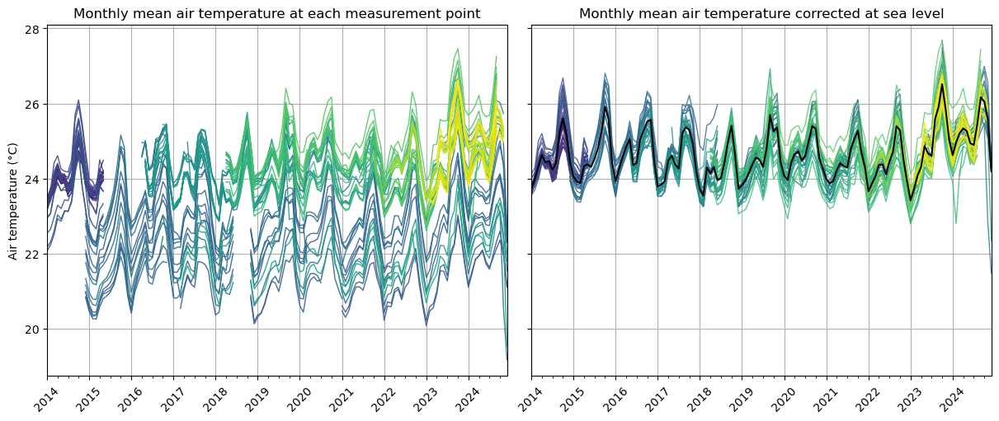

In [84]:
fig, ax=plt.subplots(1,2, sharey=True, figsize=(12, 5), layout='constrained')
xlabels=np.arange(2014,2025)
df=df.set_index('Site_id')
PM_ids=df.index.drop_duplicates()
colors = plt.cm.viridis(np.linspace(0,1,len(PM_ids)))
for i,pmid in enumerate(PM_ids):   
    df.loc[pmid,['date','Tair']].resample('M', on='date').mean().plot(ax=ax[0],linewidth=1,alpha=.9, color=colors[i])
    df.loc[pmid,['date','Tair_sl']].resample('M', on='date').mean().plot(ax=ax[1],linewidth=1, alpha=.8, color=colors[i])
df.loc[:,['date','Tair_sl']].resample('M', on='date').mean().plot(c='k',ax=ax[1])

ax[0].set_title('Monthly mean air temperature at each measurement point')
ax[1].set_title('Monthly mean air temperature corrected at sea level')
ax[0].set_ylabel('Air temperature (°C)')
[axes.grid() for axes in ax]
plt.xticks(rotation=45, ha='right')
[axes.set_xticklabels(xlabels,rotation=45, ha='center') for axes in ax]

[axes.get_legend().remove() for axes in ax]
[axes.set(xlabel=None) for axes in ax]

plt.savefig(figpath+'fig_S2.png')

### Figure S3

NOU
mean Tair 0
minimum Tair 1
maximum Tair 2
PAR
mean Tair 0
minimum Tair 1
maximum Tair 2
LAU
mean Tair 0
minimum Tair 1
maximum Tair 2
ITO1
mean Tair 0
minimum Tair 1
maximum Tair 2
ITO2
mean Tair 0
minimum Tair 1
maximum Tair 2
ITO3
mean Tair 0
minimum Tair 1
maximum Tair 2


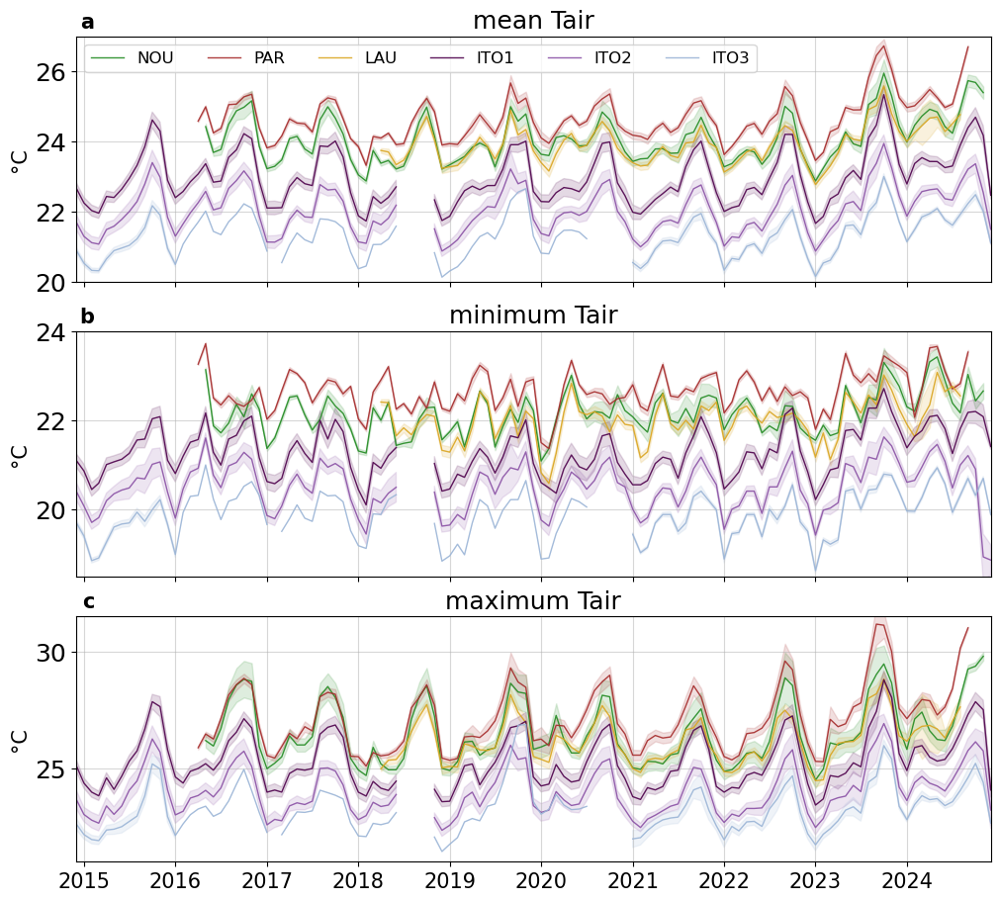

In [86]:
lbl=['a','b','c']

colors=['forestgreen','brown','gold','indigo'] #,'blue']
colline=['forestgreen','brown','goldenrod','indigo'] #,'blue']

ForestClass=['NOU','PAR','LAU','ITO1','ITO2','ITO3']
ForestCol=dict(zip(ForestClass,c))
#ForestCol=dict(zip(ForestNames,colors))
#ForestColline=dict(zip(ForestNames,colline))
ln,lx=[20,18.5,21], [27,24,31.5]

statid=['Tmean','Tmin','Tmax','Tmean slope','Tmin slope','Tmax slope']
t_sum=pd.DataFrame(columns=statid, index=ForestClass)

fig, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [4,4,4]}, sharex=True, figsize=(10,9), layout='constrained')

var='Tair'
metrics=['mean Tair','minimum Tair','maximum Tair']
# compute monthly statistic 
#dfmonthly=resampledata(uhtf,'MS',[var],'MEAN').reset_index()

for i,site in enumerate(ForestClass[:]):
    print(site)
    for mid, met in enumerate(metrics):
        print(met, mid)

        s=df[(df['ForestClass']==site) & (df['LongTermPM'])] #select long term sensors
        
        #if site=='ITO': # if ITO, only select lower forests
         #   s=s[s['ForestClass'].isin(['ITO1','ITO2'])] 
                    
        if met=='mean Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).mean().reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].mean().reset_index()  # daily mean
        elif met=='maximum Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.95).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.95).reset_index()  # daily mean
        elif met=='minimum Tair':    
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.5).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.05).reset_index()  # daily mean

        #print('mean='+str(np.round(mm[var].mean(),2)))
        
    # Subplot 1: T mean
        ax[mid].plot(mm['date'],mm[var], color=ForestCol[site], alpha=.9, lw=1, label=site) # +', m='+str(np.round(s[var].mean(),2))
        #plt.fill_between(m['date'],(m-sem)[var],(m+sem)[var], alpha=0.1,color="k")
        ax[mid].fill_between(mm['date'],mm[var]-semm[var],mm[var]+semm[var], alpha=0.15, color=ForestCol[site], zorder=1)

        ax[mid].set_title(met, fontsize=18)
        #ax[mid].legend(loc='upper left',fontsize=14)
        ax[mid].set_ylabel('°C',fontsize=15)
        ax[mid].margins(False)
        ax[mid].grid(alpha=.5)
        ax[mid].tick_params(axis='y', labelsize=18)
        ax[mid].set_ylim(ln[mid],lx[mid])


            # Theil Sen regression
        #subd=mm[(mm['date']>'2018-10-01') & (mm['date']<='2024-10-01')]  # compute trend over common years only
        subd=mm[(mm['date']<='2024-10-01')] 

        x=subd.dropna().index  #np.arange(len(mm.dropna().index))  # mm[mm['date'].dt.year<2023]
        y=np.array(subd.dropna()[var])
        #lr = LinearRegression()
        #lr.fit(x[:, None], y)  
        #lr_slope = lr.coef_[0]
        ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return values
        #ax[mid].text(0.02+i/10, 0.1, str(np.round(y.mean(),1))+'°C', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #ax[mid].text(0.01+i/10, 0.02, str(np.round(ts_slope*12,3))+'°C/yr', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #t_sum.loc[site,['Tmean','Tmin','Tmax']]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.min(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.max(),1))+'+/-'+str(np.round(y.std(),1))
        #t_sum.loc[site,['Tmean slope','min slope','max slope']]=str(np.round(ts_slope*12,4)), str(np.round(ts_ls*12,4)),str(np.round(ts_hs*12,4))
        t_sum.loc[site,statid[mid]]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1))
        t_sum.loc[site,statid[mid+3]]=str(np.round(ts_slope*12,2))+' ['+str(np.round(ts_ls*12,2))+','+str(np.round(ts_hs*12,2))+']'

[ax[k].text(0.02, 1.1, lbl[k], 
            transform=ax[k].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') for k in range(3)]

ax[0].legend(loc='best',fontsize=12,  ncol = 6)
plt.xticks(fontsize=15)

plt.savefig(figpath+'fig_S3.png')

### Figure S4

NOU
mean Tair 0
minimum Tair 1
maximum Tair 2
PAR
mean Tair 0
minimum Tair 1
maximum Tair 2
LAU
mean Tair 0
minimum Tair 1
maximum Tair 2
ITO
mean Tair 0
minimum Tair 1
maximum Tair 2


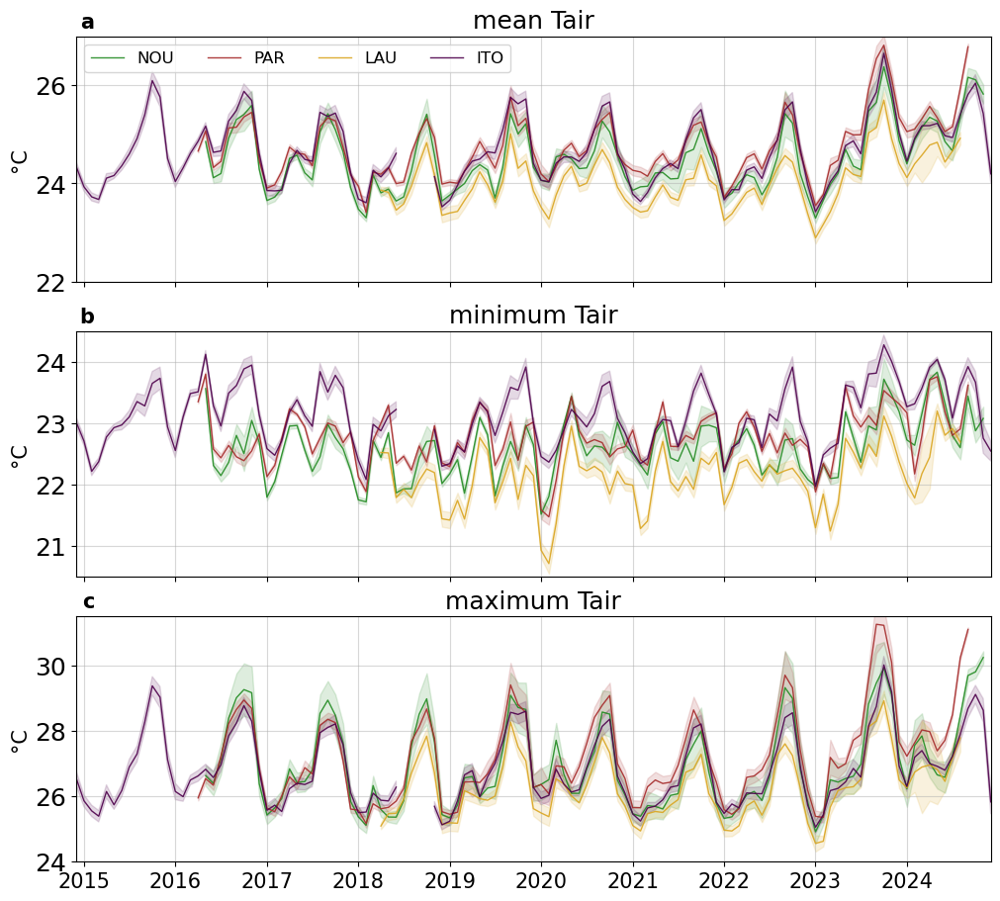

In [201]:
lbl=['a','b','c']

colors=['forestgreen','brown','gold','indigo'] #,'blue']
colline=['forestgreen','brown','goldenrod','indigo'] #,'blue']

ForestClass=['NOU','PAR','LAU','ITO1','ITO2','ITO3']
ForestCol=dict(zip(ForestNames,c))
#ForestCol=dict(zip(ForestNames,colors))
#ForestColline=dict(zip(ForestNames,colline))
ln,lx=[22,20.5,24], [27,24.5,31.5]

statid=['Tmean','Tmin','Tmax','Tmean slope','Tmin slope','Tmax slope']
t_sum=pd.DataFrame(columns=statid, index=ForestClass)

fig, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [4,4,4]}, sharex=True, figsize=(10,9), layout='constrained')

var='Tair_sl'
metrics=['mean Tair','minimum Tair','maximum Tair']
# compute monthly statistic 
#dfmonthly=resampledata(uhtf,'MS',[var],'MEAN').reset_index()

for i,site in enumerate(ForestNames[:]):
    print(site)
    for mid, met in enumerate(metrics):
        print(met, mid)

        s=df[(df['ForestName']==site) & (df['LongTermPM'])] #select long term sensors
        
        #if site=='ITO': # if ITO, only select lower forests
         #   s=s[s['ForestClass'].isin(['ITO1','ITO2'])] 
                    
        if met=='mean Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).mean().reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].mean().reset_index()  # daily mean
        elif met=='maximum Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.95).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.95).reset_index()  # daily mean
        elif met=='minimum Tair':    
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.5).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.05).reset_index()  # daily mean

        #print('mean='+str(np.round(mm[var].mean(),2)))
        
    # Subplot 1: T mean
        ax[mid].plot(mm['date'],mm[var], color=ForestCol[site], alpha=.9, lw=1, label=site) # +', m='+str(np.round(s[var].mean(),2))
        #plt.fill_between(m['date'],(m-sem)[var],(m+sem)[var], alpha=0.1,color="k")
        ax[mid].fill_between(mm['date'],mm[var]-semm[var],mm[var]+semm[var], alpha=0.15, color=ForestCol[site], zorder=1)

        ax[mid].set_title(met, fontsize=18)
        #ax[mid].legend(loc='upper left',fontsize=14)
        ax[mid].set_ylabel('°C',fontsize=15)
        ax[mid].margins(False)
        ax[mid].grid(alpha=.5)
        ax[mid].tick_params(axis='y', labelsize=18)
        ax[mid].set_ylim(ln[mid],lx[mid])


            # Theil Sen regression
        #subd=mm[(mm['date']>'2018-10-01') & (mm['date']<='2024-10-01')]  # compute trend over common years only
        subd=mm[(mm['date']<='2024-10-01')] 

        x=subd.dropna().index  #np.arange(len(mm.dropna().index))  # mm[mm['date'].dt.year<2023]
        y=np.array(subd.dropna()[var])
        #lr = LinearRegression()
        #lr.fit(x[:, None], y)  
        #lr_slope = lr.coef_[0]
        ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return values
        #ax[mid].text(0.02+i/10, 0.1, str(np.round(y.mean(),1))+'°C', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #ax[mid].text(0.01+i/10, 0.02, str(np.round(ts_slope*12,3))+'°C/yr', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #t_sum.loc[site,['Tmean','Tmin','Tmax']]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.min(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.max(),1))+'+/-'+str(np.round(y.std(),1))
        #t_sum.loc[site,['Tmean slope','min slope','max slope']]=str(np.round(ts_slope*12,4)), str(np.round(ts_ls*12,4)),str(np.round(ts_hs*12,4))
        t_sum.loc[site,statid[mid]]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1))
        t_sum.loc[site,statid[mid+3]]=str(np.round(ts_slope*12,2))+' ['+str(np.round(ts_ls*12,2))+','+str(np.round(ts_hs*12,2))+']'

[ax[k].text(0.02, 1.1, lbl[k], 
            transform=ax[k].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') for k in range(3)]

ax[0].legend(loc='best',fontsize=12,  ncol = 6)
plt.xticks(fontsize=15)

plt.savefig(figpath+'fig_S4.png')

### Figure S5

NOU
mean Tair 0
minimum Tair 1
maximum Tair 2
PAR
mean Tair 0
minimum Tair 1
maximum Tair 2
LAU
mean Tair 0
minimum Tair 1
maximum Tair 2
ITO
mean Tair 0
minimum Tair 1
maximum Tair 2


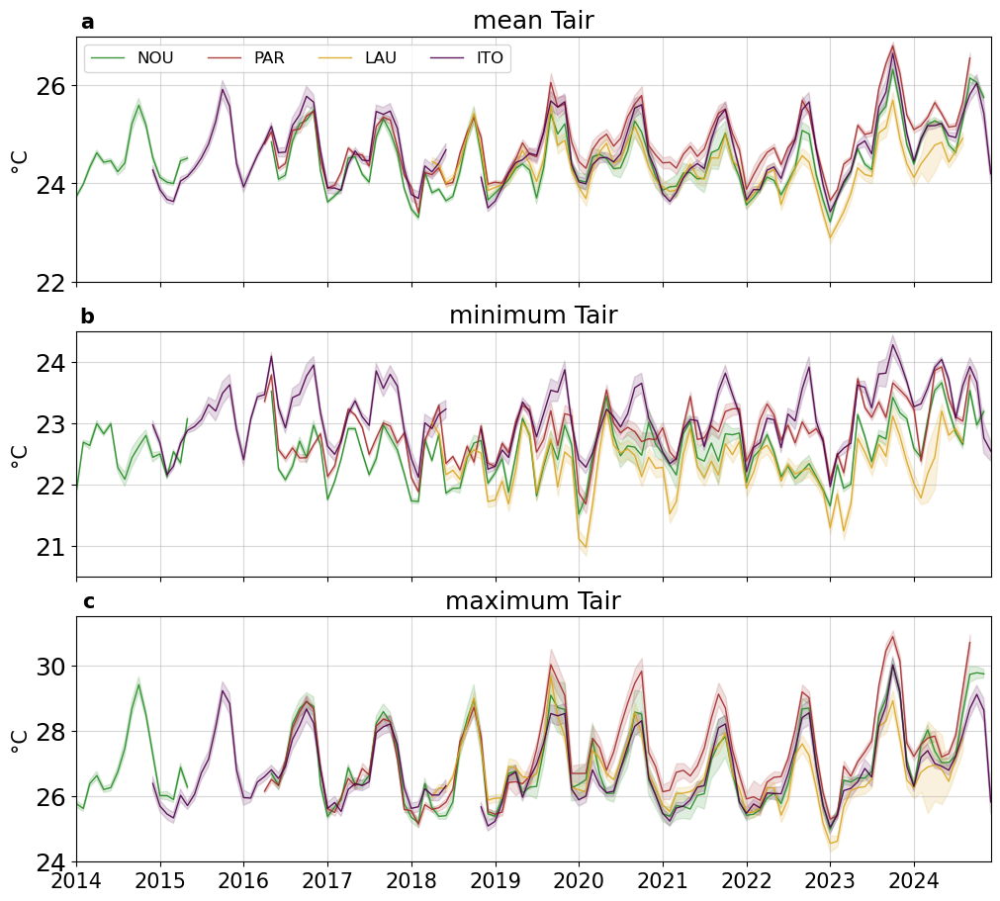

In [204]:
lbl=['a','b','c']

colors=['forestgreen','brown','gold','indigo'] #,'blue']
colline=['forestgreen','brown','goldenrod','indigo'] #,'blue']

ForestClass=['NOU','PAR','LAU','ITO1','ITO2','ITO3']
ForestCol=dict(zip(ForestNames,c))
#ForestCol=dict(zip(ForestNames,colors))
#ForestColline=dict(zip(ForestNames,colline))
ln,lx=[22,20.5,24], [27,24.5,31.5]

statid=['Tmean','Tmin','Tmax','Tmean slope','Tmin slope','Tmax slope']
t_sum=pd.DataFrame(columns=statid, index=ForestClass)

fig, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [4,4,4]}, sharex=True, figsize=(10,9), layout='constrained')

var='Tair_sl'
metrics=['mean Tair','minimum Tair','maximum Tair']
# compute monthly statistic 
#dfmonthly=resampledata(uhtf,'MS',[var],'MEAN').reset_index()

for i,site in enumerate(ForestNames[:]):
    print(site)
    for mid, met in enumerate(metrics):
        print(met, mid)

        s=df[(df['ForestName']==site)] #select long term sensors
        
        #if site=='ITO': # if ITO, only select lower forests
         #   s=s[s['ForestClass'].isin(['ITO1','ITO2'])] 
                    
        if met=='mean Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).mean().reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].mean().reset_index()  # daily mean
        elif met=='maximum Tair':
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.95).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.95).reset_index()  # daily mean
        elif met=='minimum Tair':    
            semm=s[['date',var]].groupby(pd.Grouper(key='date')).sem().reset_index().groupby(pd.Grouper(key='date',freq='MS')).quantile(0.5).reset_index(drop=False)       
            mm=s[['date',var]].groupby(pd.Grouper(key='date',freq='MS'))[var].quantile(0.05).reset_index()  # daily mean

        #print('mean='+str(np.round(mm[var].mean(),2)))
        
    # Subplot 1: T mean
        ax[mid].plot(mm['date'],mm[var], color=ForestCol[site], alpha=.9, lw=1, label=site) # +', m='+str(np.round(s[var].mean(),2))
        #plt.fill_between(m['date'],(m-sem)[var],(m+sem)[var], alpha=0.1,color="k")
        ax[mid].fill_between(mm['date'],mm[var]-semm[var],mm[var]+semm[var], alpha=0.15, color=ForestCol[site], zorder=1)

        ax[mid].set_title(met, fontsize=18)
        #ax[mid].legend(loc='upper left',fontsize=14)
        ax[mid].set_ylabel('°C',fontsize=15)
        ax[mid].margins(False)
        ax[mid].grid(alpha=.5)
        ax[mid].tick_params(axis='y', labelsize=18)
        ax[mid].set_ylim(ln[mid],lx[mid])


            # Theil Sen regression
        #subd=mm[(mm['date']>'2018-10-01') & (mm['date']<='2024-10-01')]  # compute trend over common years only
        subd=mm[(mm['date']<='2024-10-01')] 

        x=subd.dropna().index  #np.arange(len(mm.dropna().index))  # mm[mm['date'].dt.year<2023]
        y=np.array(subd.dropna()[var])
        #lr = LinearRegression()
        #lr.fit(x[:, None], y)  
        #lr_slope = lr.coef_[0]
        ts_slope, ts_inter, ts_ls, ts_hs = theilslopes(y, x)  # Note the additional underscores (_) to ignore the last three return values
        #ax[mid].text(0.02+i/10, 0.1, str(np.round(y.mean(),1))+'°C', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #ax[mid].text(0.01+i/10, 0.02, str(np.round(ts_slope*12,3))+'°C/yr', c=colline[i], transform=ax[mid].transAxes,fontsize=10)
        #t_sum.loc[site,['Tmean','Tmin','Tmax']]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.min(),1))+'+/-'+str(np.round(y.std(),1)),str(np.round(y.max(),1))+'+/-'+str(np.round(y.std(),1))
        #t_sum.loc[site,['Tmean slope','min slope','max slope']]=str(np.round(ts_slope*12,4)), str(np.round(ts_ls*12,4)),str(np.round(ts_hs*12,4))
        t_sum.loc[site,statid[mid]]=str(np.round(y.mean(),1))+'+/-'+str(np.round(y.std(),1))
        t_sum.loc[site,statid[mid+3]]=str(np.round(ts_slope*12,2))+' ['+str(np.round(ts_ls*12,2))+','+str(np.round(ts_hs*12,2))+']'

[ax[k].text(0.02, 1.1, lbl[k], 
            transform=ax[k].transAxes,fontsize=15, fontweight='bold', va='top', ha='right') for k in range(3)]

ax[0].legend(loc='best',fontsize=12,  ncol = 6)
plt.xticks(fontsize=15)

plt.savefig(figpath+'fig_S5.png')

### Figure S10

NOU
PAR
LAU
ITO1
ITO2
ITO3


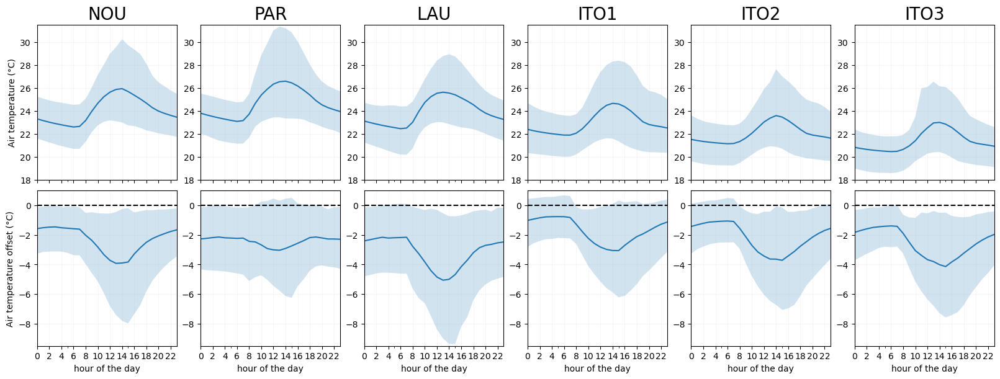

In [88]:
# daily cycle and hourly offset 

fig, ax = plt.subplots(2,6, sharex=True, figsize=(16,6),constrained_layout=True)
for i,n in enumerate(ForestClasses):
    print(n)

    # select data
    subset=df[(df['ForestClass']==n)&(df['LongTermPM']==True)][['date','Tair','offsethm','erachm_M']].dropna().set_index('date')
    
    #Tair 
    X=subset.astype(float).groupby(subset.index.hour)['Tair'].quantile(0.99)#.plot(ax=ax[0,i],c='r')
    N=subset.astype(float).groupby(subset.index.hour)['Tair'].quantile(0.01)#.plot(ax=ax[0,i],c='b')
    ax[0,i].fill_between(N.index, N.values,X.values, alpha=0.2)
    subset.groupby(subset.index.hour)['Tair'].mean().plot(ax=ax[0,i])

    #Offset
    ax[1,i].plot(subset.groupby(subset.index.hour)['offsethm'].mean())
    X=subset.astype(float).groupby(subset.index.hour)['offsethm'].quantile(0.99)#.plot(ax=ax[1,i],c='r')
    N=subset.astype(float).groupby(subset.index.hour)['offsethm'].quantile(0.01)#.plot(ax=ax[1,i],c='b')
    ax[1,i].fill_between(N.index, N.values,X.values, alpha=0.2)
    ax[0,i].set_title(n,fontsize =20)
    ax[0,i].set_ylim(18,31.5)
    ax[1,i].set_ylim(-9.5,1)
    ax[1,i].set_xlabel('hour of the day')

ax[0,0].set_ylabel('Air temperature (°C)')
ax[1,0].set_ylabel('Air temperature offset (°C)')
[a.margins(False) for a in ax.flat]
[a.axhline(y=0, color='k', linestyle='--',zorder=5) for a in ax.flat]
[a.grid(True, alpha=.1, zorder=4) for a in ax.flat]
plt.xticks(np.arange(0,24,2),np.arange(0,24,2)) 

plt.savefig(figpath+'fig_S10.png', dpi=300)

### Figure S11

NOU
PAR
LAU
ITO1
ITO2
ITO3


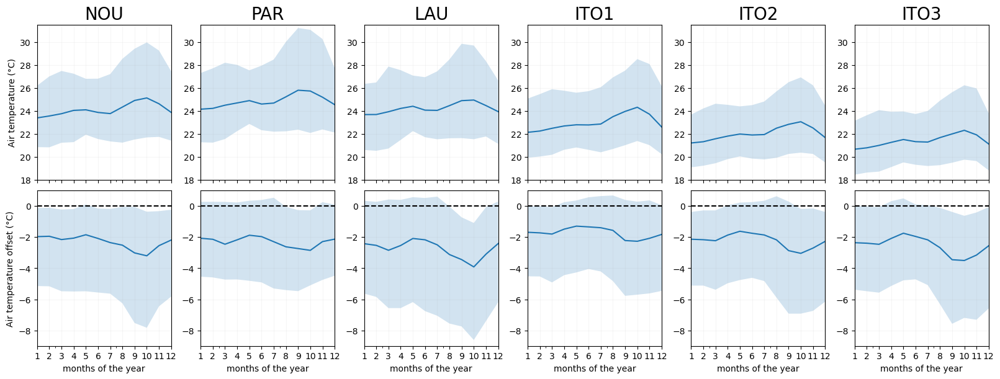

In [90]:
# seasonal plot

fig, ax = plt.subplots(2,6, sharex=True, figsize=(16,6),constrained_layout=True)
for i,n in enumerate(ForestClasses):
    print(n)

    # select data
    subset=df[(df['ForestClass']==n)][['date','Tair','offsethm','erachm_M']].dropna().set_index('date')
    
    #Tair 
    X=subset.astype(float).groupby(subset.index.month)['Tair'].quantile(0.99)#.plot(ax=ax[0,i],c='r')
    N=subset.astype(float).groupby(subset.index.month)['Tair'].quantile(0.01)#.plot(ax=ax[0,i],c='b')
    ax[0,i].fill_between(N.index, N.values,X.values, alpha=0.2)
    subset.groupby(subset.index.month)['Tair'].mean().plot(ax=ax[0,i])

    #Offset
    ax[1,i].plot(subset.groupby(subset.index.month)['offsethm'].mean())
    X=subset.astype(float).groupby(subset.index.month)['offsethm'].quantile(0.99)#.plot(ax=ax[1,i],c='r')
    N=subset.astype(float).groupby(subset.index.month)['offsethm'].quantile(0.01)#.plot(ax=ax[1,i],c='b')
    ax[1,i].fill_between(N.index, N.values,X.values, alpha=0.2)
    ax[0,i].set_title(n,fontsize =20)
    ax[0,i].set_ylim(18,31.5)
    ax[1,i].set_ylim(-9,1)
    ax[1,i].set_xlabel('months of the year')
    
ax[0,0].set_ylabel('Air temperature (°C)')
ax[1,0].set_ylabel('Air temperature offset (°C)')
#ax[2,0].set_ylabel('ERA5-Land air temperature (°C)')

[a.margins(False) for a in ax.flat]
[a.axhline(y=0, color='k', linestyle='--',zorder=5) for a in ax.flat]
[a.grid(True, alpha=.1, zorder=4) for a in ax.flat]
plt.xticks(subset.index.month.drop_duplicates(),subset.index.month.drop_duplicates()) 
plt.savefig(figpath+'fig_S11.png', dpi=300)
    

### Figure S13

LAU
1750
PAR
14136
NOU
11160
ITO1
1488
ITO2
2232
ITO3
1488


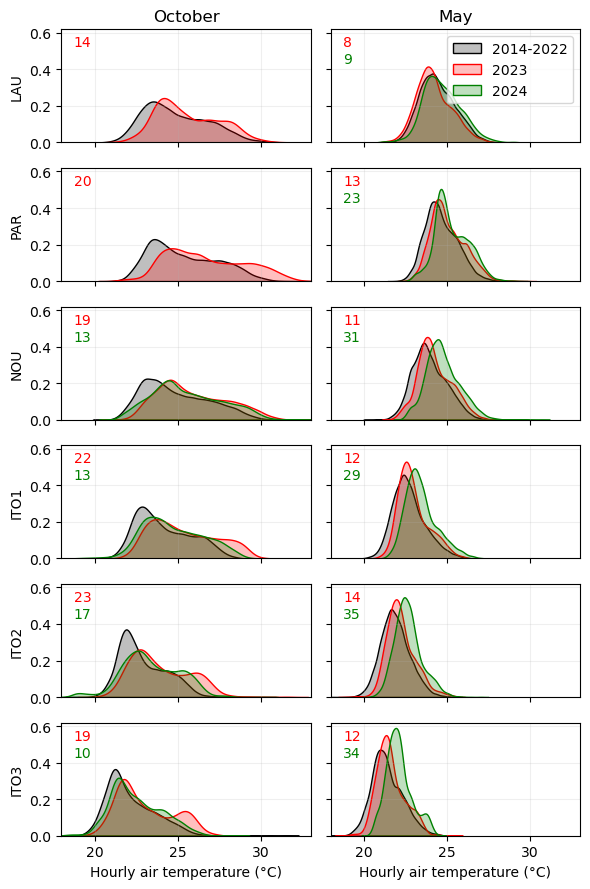

In [92]:
ForestClasses=['LAU','PAR','NOU','ITO1','ITO2','ITO3']
fig,ax=plt.subplots(6,2, sharey=True,sharex=True, layout='tight', figsize=(6,9))
for i,f in enumerate(ForestClasses):
    print(f)
    d=df[df['ForestClass']==f]
    may_old=d[(d['date'].dt.month==5)&(d['date'].dt.year<2023)]
    may_23=d[(d['date'].dt.month==5)&(d['date'].dt.year==2023)]
    may_24=d[(d['date'].dt.month==5)&(d['date'].dt.year==2024)]

    oct_old=d[(d['date'].dt.month==10)&(d['date'].dt.year<2023)]
    oct_23=d[(d['date'].dt.month==10)&(d['date'].dt.year==2023)]
    oct_24=d[(d['date'].dt.month==10)&(d['date'].dt.year==2024)]

    l=np.array([len(oct_23),len(oct_24),len(may_23),len(may_24)])
    nsample=np.min(l[l != 0]) #define the number of samples based on 2023 and 2024 minimum number of samples
    print(nsample)
    
    sns.kdeplot(oct_old['Tair'], fill=True, color="k", ax=ax[i,0])
    sns.kdeplot(oct_23['Tair'], fill=True, color="r", ax=ax[i,0])
    if not oct_24['Tair'].empty:
        sns.kdeplot(oct_24['Tair'], fill=True, color="g", ax=ax[i,0])
    sns.kdeplot(may_old['Tair'], fill=True, color="k", ax=ax[i,1])
    sns.kdeplot(may_23['Tair'], fill=True, color="r", ax=ax[i,1])
    sns.kdeplot(may_24['Tair'], fill=True, color="g", ax=ax[i,1])

    ax[i,0].set(ylabel=f)
    ax[i,1].set(ylabel=None)

# compute the novelty index

    old=[oct_old,may_old]
    novelties=[[],[],[],[]]
    seasons=['oct_23', 'oct_24', 'may_23', 'may_24']
    for s,dnew in enumerate([oct_23['Tair'], oct_24['Tair'], may_23['Tair'], may_24['Tair']]):

        if not dnew.empty:
            dhist=old[int(s/2)]['Tair']
            for k in range(10):
                x0=np.random.choice(dhist, size=nsample)  # choose random sensors
                x1 = dnew
                kde0 = gaussian_kde(x0, bw_method=0.3)
                kde1 = gaussian_kde(x1, bw_method=0.3)

                xmin = min(x0.min(), x1.min())
                xmax = max(x0.max(), x1.max())
                dx = 0.2 * (xmax - xmin) # add a 20% margin, as the kde is wider than the data
                xmin -= dx
                xmax += dx

                x = np.linspace(xmin, xmax, 500)
                kde0_x = kde0(x)
                kde1_x = kde1(x)
                inters_x = np.minimum(kde0_x, kde1_x)
                area_inters_x = np.trapz(inters_x, x)
                novelty=1-area_inters_x

                novelties[s].append(novelty*100)
    ni=[int(np.round(np.mean(n),2)) if len(n)!=0 else math.nan for n in novelties]
    #print(ni)
    if not math.isnan(ni[0]):
        ax[i,0].text(0.05,0.85, ni[0] ,c='r',transform=ax[i,0].transAxes)
    if not math.isnan(ni[1]):
        ax[i,0].text(0.05,0.7, ni[1] ,c='g',transform=ax[i,0].transAxes)
    if not math.isnan(ni[2]):
        ax[i,1].text(0.05,0.85, ni[2], c='r', transform=ax[i,1].transAxes)
    if not math.isnan(ni[3]):
        ax[i,1].text(0.05,0.7, ni[3] ,c='g', transform=ax[i,1].transAxes)

    ax[i,0].grid(alpha=.2)
    ax[i,1].grid(alpha=.2)

ax[0,1].legend(['2014-2022','2023','2024'],loc='upper right',fontsize=10)
ax[0,0].set_xlim(18,33)
ax[0,0].set_title('October')
ax[0,1].set_title('May')
ax[5,0].set_xlabel('Hourly air temperature (°C)')
ax[5,1].set_xlabel('Hourly air temperature (°C)')

plt.savefig(figpath+'fig_S13.png', dpi=300)


### Figure S15 (SWC Guyaflux)

In [94]:
# open Paracou flux tower data
GXpath="/Users/gabrielhes/Desktop/PhD/Work/Axis2/Data_Guyane/Data_macroclimate/raw/"
dgx=pd.read_excel(GXpath+'GX-METEO-2015 - 2024E - RG.xlsx', sheet_name='Gxmeteo E', usecols=['Year','Month','jour','heure+min','time','SWC','Temp(55)'])
dgx['Hour']=dgx['heure+min'].astype('int')
dgx['Minute']=((dgx['heure+min']-dgx['Hour'])*60).astype('int')
dgx["YMD"]=pd.to_datetime(dgx["Year"], format="%Y") + pd.to_timedelta(dgx["jour"]-1, unit="D") # transform julian day to date
dgx['Day']=dgx["YMD"].dt.day
dgx['date']=pd.to_datetime(dgx[['Year','Month','Day','Hour','Minute']]) # create date column
dgx.set_index('date', inplace=True)

swc=dgx.drop(columns='Temp(55)')

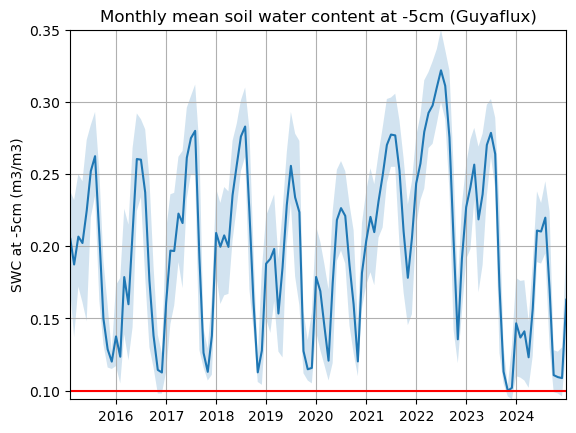

In [95]:
fig,ax=plt.subplots(1)
ax.plot(swc['SWC'].resample('M').mean())
ax.grid()
ax.margins(False)
ax.fill_between(swc['SWC'].resample('M').quantile(0.05).index, swc['SWC'].resample('M').quantile(0.05),swc['SWC'].resample('M').quantile(0.95), alpha=.2)
ax.axhline(swc['SWC'].resample('M').mean().min(), c='r',zorder=2)
ax.set_ylabel('SWC at -5cm (m3/m3)')
plt.title('Monthly mean soil water content at -5cm (Guyaflux)')
plt.savefig(figpath+'fig_S15.png', dpi=300)

### Figure S17 (GX VS ERA5L)

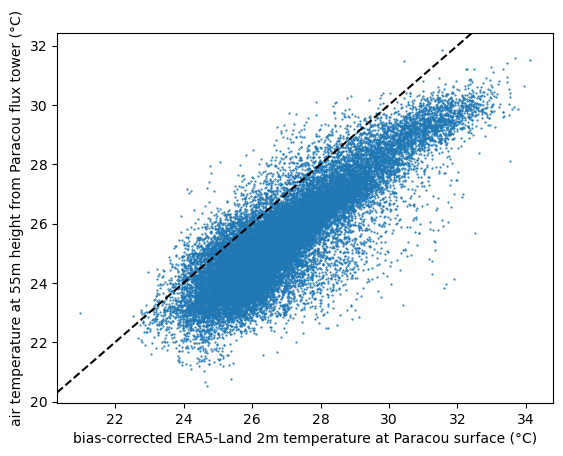

In [235]:
T55h=dgx.drop(columns='SWC')['Temp(55)'].dropna().resample('H').mean()

#Here we arbitrarily take PARS4 sensor in Paracou 
dfpar=df.loc['PARS4',['erachm_M','date']].set_index('date')

data=pd.concat([dfpar,T55h],axis=1).dropna()


fig,ax=plt.subplots(1)
data.plot.scatter('erachm_M','Temp(55)', s=.3, ax=ax)
ax.axline((25, 25), slope=1,c='k', linestyle='--')
plt.xlabel('bias-corrected ERA5-Land 2m temperature at Paracou surface (°C)')
plt.ylabel('air temperature at 55m height from Paracou flux tower (°C)')
plt.savefig(figpath+'fig_S17.png', dpi=300)

In [233]:
print('End of script')

End of script
